# 1. Аналитическое решение уравнения Шрёдингера для одной бесконечно глубокой потенциальной ямы.

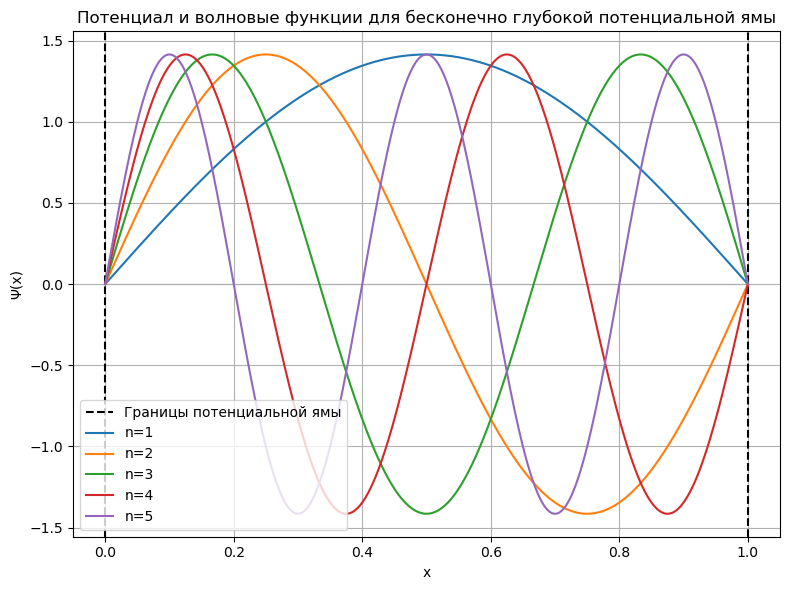

n = 1, E_n = 4.935 (в условных единицах)
n = 2, E_n = 19.739 (в условных единицах)
n = 3, E_n = 44.413 (в условных единицах)
n = 4, E_n = 78.957 (в условных единицах)
n = 5, E_n = 123.370 (в условных единицах)


In [44]:
import numpy as np
import matplotlib.pyplot as plt
from sympy import symbols, sin, pi, sqrt

# Параметры задачи
L = 1  # ширина потенциальной ямы (условная единица)
n_values = [1, 2, 3, 4, 5]  # квантовые числа

# Символьные переменные
x = symbols('x')

# Функция волновой функции
psi = lambda n, x: sqrt(2/L) * sin(n * pi * x / L)

# Создание потенциала
def potential(x, L):
    return np.where((x >= 0) & (x <= L), 0, np.inf)  # 0 внутри ямы, бесконечность вне

# Вычисление и визуализация
x_vals = np.linspace(0, L, 500)
V_vals = potential(x_vals, L)

plt.figure(figsize=(8, 6))

# Потенциал
plt.fill_between(x_vals, 0, V_vals, color="black", alpha=0.1)

# Стенки ямы (вертикальные линии)
plt.axvline(x=0, color="black", linestyle="--", label="Границы потенциальной ямы")
plt.axvline(x=L, color="black", linestyle="--")

# Волновые функции
for n in n_values:
    psi_vals = [psi(n, xi).evalf() for xi in x_vals]
    plt.plot(x_vals, psi_vals, label=f'n={n}')

# Настройки графика
plt.xlabel("x")
plt.ylabel("Ψ(x)")
plt.title("Потенциал и волновые функции для бесконечно глубокой потенциальной ямы")
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()

# Собственные энергии (выражение E_n = (n^2 * h^2) / (8mL^2), но без h и m для удобства)
def energy(n, L):
    return (n**2 * np.pi**2) / (2 * L**2)

energies = [energy(n, L) for n in n_values]
for n, E in zip(n_values, energies):
    print(f"n = {n}, E_n = {E:.3f} (в условных единицах)")

# 2. Введение конечной глубины ямы, нахождение собственных состояний.

Собственные энергии: [-9.180259926233985, -9.180259926233367, -3.054233508773814, -3.054233508773814]


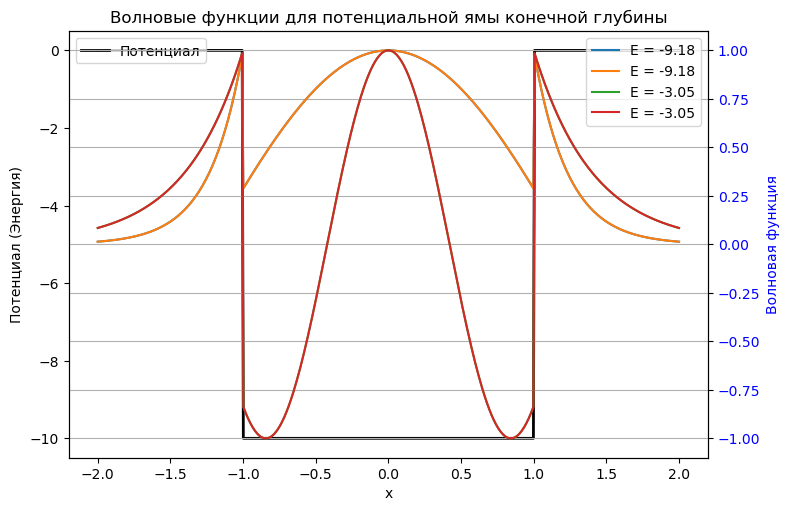

In [47]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import fsolve

# Задаём параметры
hbar = 1.0  # Постоянная Планка (условные единицы)
m = 1.0  # Масса частицы
a = 1.0  # Половина ширины ямы
V0 = 10.0  # Глубина ямы

# Определяем волновые числа
def k(E):
    return np.sqrt(np.maximum(2 * m * (E + V0), 0)) / hbar  # Чтобы избежать sqrt отрицательного

def kappa(E):
    return np.sqrt(np.maximum(-2 * m * E, 0)) / hbar  # Чтобы избежать sqrt отрицательного

# Функция для поиска собственных энергий (из условия тангенса)
def transcendental_eq(E):
    k_val = k(E)
    kappa_val = kappa(E)
    
    # Избегаем деления на ноль
    if k_val == 0:
        return np.inf  # Возвращаем бесконечность, чтобы fsolve не считал такие точки
    return np.tan(k_val * a) - kappa_val / k_val

# Поиск решений
E_guess = np.linspace(-V0, 0, 100)  # Диапазон энергий
E_levels = []
for i in range(len(E_guess) - 1):
    if transcendental_eq(E_guess[i]) * transcendental_eq(E_guess[i+1]) < 0:
        E_root = fsolve(transcendental_eq, (E_guess[i] + E_guess[i+1]) / 2)[0]
        E_levels.append(E_root)

print("Собственные энергии:", E_levels)

# Визуализация решений
x = np.linspace(-2*a, 2*a, 500)

# Создание графика с двумя осями
fig, ax1 = plt.subplots(figsize=(8, 5))

# График потенциала
V = np.zeros_like(x)
V[np.abs(x) <= a] = -V0  # Потенциал ямы
ax1.plot(x, V, 'k', label="Потенциал", linewidth=2)
ax1.set_xlabel("x")
ax1.set_ylabel("Потенциал (Энергия)", color='k')
ax1.tick_params(axis='y', labelcolor='k')

# Вторая ось для волновых функций
ax2 = ax1.twinx()

# Графики волновых функций
for E in E_levels:
    psi_x = np.cos(k(E) * x) * (np.abs(x) <= a) + np.exp(-kappa(E) * (np.abs(x) - a)) * (np.abs(x) > a)
    ax2.plot(x, psi_x, label=f"E = {E:.2f}")

ax2.set_ylabel("Волновая функция", color='b')
ax2.tick_params(axis='y', labelcolor='b')

# Настройки графика
fig.tight_layout()
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.title("Волновые функции для потенциальной ямы конечной глубины")
plt.grid()
plt.show()

 # 3. Две одинаковые потенциальные ямы: туннелирование между ними.

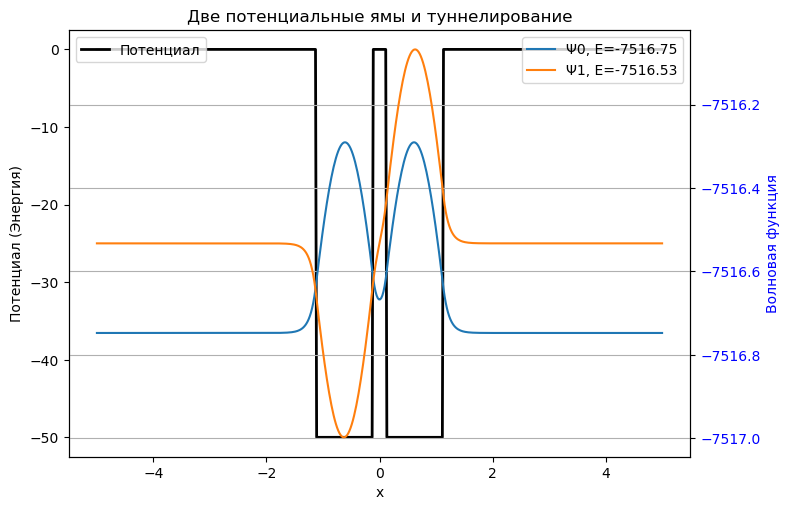

Разница энергий первых двух состояний: ΔE = 2.15e-01 в условных единицах (проверка на расщепление уровней из-за туннелирования)


In [239]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.linalg import eigh_tridiagonal

# Параметры системы
a = 1.0  # Ширина ям
d = 1.25  # Расстояние между ямами
V0 = 50  # Глубина ям
N = 500  # Число дискретных точек

x_min, x_max = -5, 5  # Границы области моделирования
x = np.linspace(x_min, x_max, N)  # Координатная сетка
dx = x[1] - x[0]  # Шаг сетки

# Определяем потенциал
V = np.zeros(N)
V[np.abs(x + d/2) < a/2] = -V0  # Левая яма
V[np.abs(x - d/2) < a/2] = -V0  # Правая яма

# Построение матрицы Гамильтониана (разностный метод)
diag = np.ones(N) / dx**2  # Главная диагональ (кинетическая энергия)
off_diag = -0.5 * np.ones(N - 1) / dx**2  # Соседние элементы

# Итоговая диагональ с учётом потенциала
H_diag = -2 * diag + V

# Решение уравнения Шрёдингера (нахождение собственных значений)
E, psi = eigh_tridiagonal(H_diag, off_diag)

# Нормируем волновые функции
psi /= np.sqrt(dx)

# Масштабируем волновые функции, чтобы их значения были на одном уровне с энергией
scale_factor = np.max(np.abs(psi))  # Масштабируем волновые функции
psi_scaled = psi / scale_factor  # Нормализуем для корректного масштаба

# Визуализация с двумя осями y
fig, ax1 = plt.subplots(figsize=(8, 5))

# График потенциала
ax1.plot(x, V, 'k', label="Потенциал", linewidth=2)
ax1.set_xlabel("x")
ax1.set_ylabel("Потенциал (Энергия)", color='k')
ax1.tick_params(axis='y', labelcolor='k')

# Создание второй оси для волновых функций
ax2 = ax1.twinx()

# Графики волновых функций
ax2.plot(x, psi_scaled[:, 0] + E[0], label=f"Ψ0, E={E[0]:.2f}")
ax2.plot(x, psi_scaled[:, 1] + E[1], label=f"Ψ1, E={E[1]:.2f}")

ax2.set_ylabel("Волновая функция", color='b')
ax2.tick_params(axis='y', labelcolor='b')

# Настройки графика
fig.tight_layout()
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.title("Две потенциальные ямы и туннелирование")
plt.grid()
plt.show()

# Разность энергий между симметричным и антисимметричным состоянием
delta_E = E[1] - E[0]
print(f"Разница энергий первых двух состояний: ΔE = {delta_E:.2e} в условных единицах (проверка на расщепление уровней из-за туннелирования)")

# 4. Исследование локализованных состояний в системе из 2 одномерных прямоугольных потенциальных ям.

Для d = 0.50, разница энергий ΔE = 5.18e+00 (проверка на туннелирование)
Для d = 1.00, разница энергий ΔE = 3.03e+00 (проверка на туннелирование)
Для d = 1.50, разница энергий ΔE = 2.11e-02 (проверка на туннелирование)
Для d = 2.00, разница энергий ΔE = 1.39e-04 (проверка на туннелирование)
Для d = 2.50, разница энергий ΔE = 1.35e-06 (проверка на туннелирование)
Для d = 3.00, разница энергий ΔE = 8.88e-09 (проверка на туннелирование)


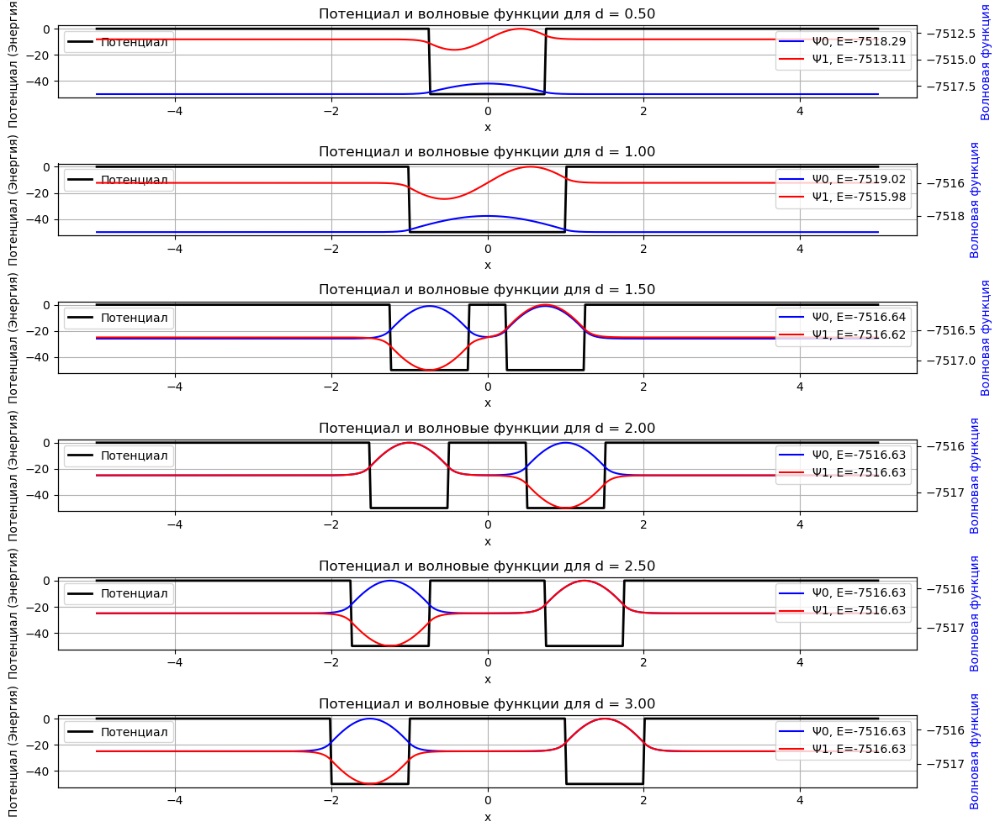

In [57]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.linalg import eigh_tridiagonal

# Функция для вычисления волновых функций и энергий
def calculate_wavefunctions_and_energies(a, d, V0, N, x_min, x_max):
    x = np.linspace(x_min, x_max, N)  # Координатная сетка
    dx = x[1] - x[0]  # Шаг сетки

    # Потенциал с двумя ямами
    V = np.zeros(N)
    V[np.abs(x + d/2) < a/2] = -V0  # Левая яма
    V[np.abs(x - d/2) < a/2] = -V0  # Правая яма

    # Построение матрицы Гамильтониана (разностный метод)
    diag = np.ones(N) / dx**2  # Главная диагональ (кинетическая энергия)
    off_diag = -0.5 * np.ones(N - 1) / dx**2  # Соседние элементы

    # Итоговая диагональ с учётом потенциала
    H_diag = -2 * diag + V

    # Решение уравнения Шрёдингера (нахождение собственных значений)
    E, psi = eigh_tridiagonal(H_diag, off_diag)

    # Нормируем волновые функции
    psi /= np.sqrt(dx)

    # Масштабируем волновые функции, чтобы их значения были на одном уровне с энергией
    scale_factor = np.max(np.abs(psi))  # Масштабируем волновые функции
    psi_scaled = psi / scale_factor  # Нормализуем для корректного масштаба

    return x, V, E, psi_scaled

# Параметры
a = 1.0  # Ширина ям
V0 = 50  # Глубина ям
N = 500  # Число дискретных точек
x_min, x_max = -5, 5  # Границы области моделирования

# Различные расстояния между ямами для исследования туннелирования
distances = np.linspace(0.5, 3.0, 6)

# Подготовка графиков
fig, axes = plt.subplots(len(distances), 1, figsize=(12, 10))

for i, d in enumerate(distances):
    # Расчёт для текущего расстояния между ямами
    x, V, E, psi_scaled = calculate_wavefunctions_and_energies(a, d, V0, N, x_min, x_max)

    # График потенциала и волновых функций
    ax = axes[i]
    
    # График потенциала
    ax.plot(x, V, 'k', label="Потенциал", linewidth=2)
    ax.set_xlabel("x")
    ax.set_ylabel("Потенциал (Энергия)", color='k')
    
    # Создание второй оси для волновых функций
    ax2 = ax.twinx()
    ax2.plot(x, psi_scaled[:, 0] + E[0], label=f"Ψ0, E={E[0]:.2f}", color='b')
    ax2.plot(x, psi_scaled[:, 1] + E[1], label=f"Ψ1, E={E[1]:.2f}", color='r')
    
    # Настройка второй оси
    ax2.set_ylabel("Волновая функция", color='b')
    
    # Заголовок для каждого расстояния
    ax.set_title(f"Потенциал и волновые функции для d = {d:.2f}")
    ax.grid(True)
    
    # Легенды для обоих графиков
    ax.legend(loc='upper left')
    ax2.legend(loc='upper right')

    # Вывод разницы энергий для первого и второго состояний
    delta_E = E[1] - E[0]
    print(f"Для d = {d:.2f}, разница энергий ΔE = {delta_E:.2e} (проверка на туннелирование)")

plt.tight_layout()
plt.show()

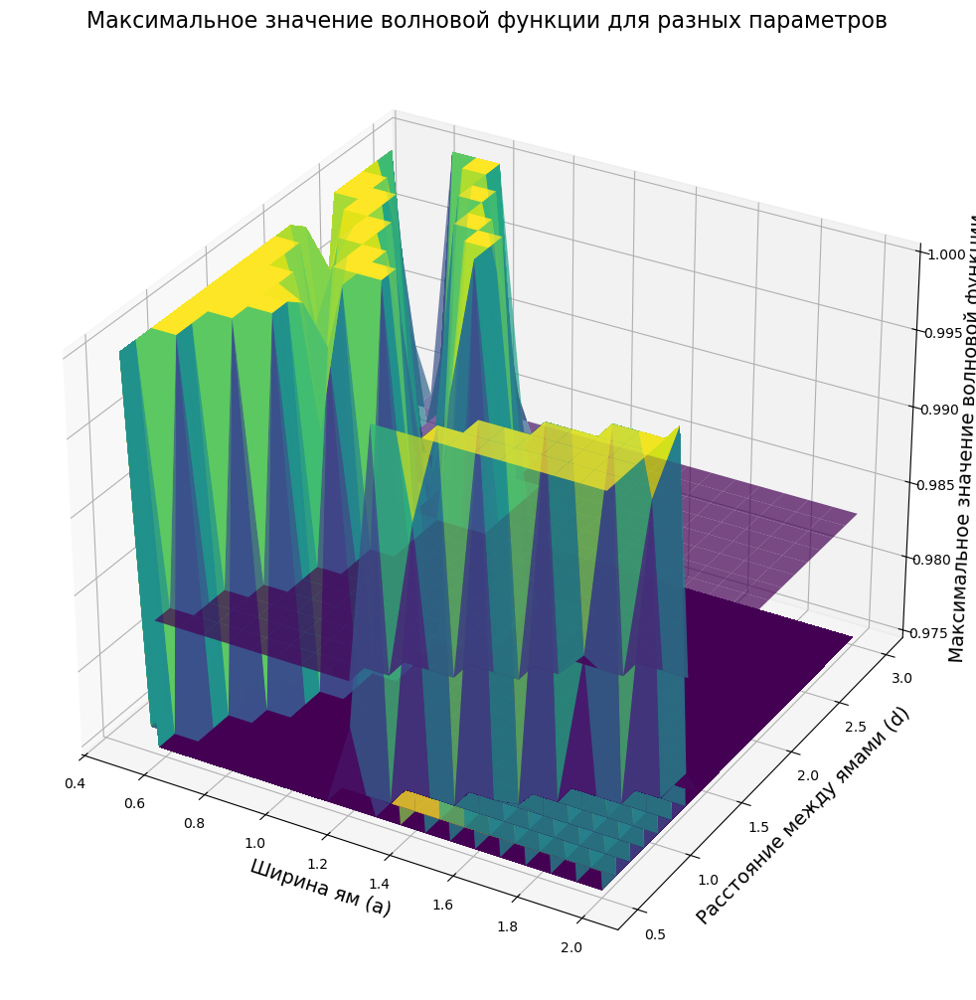

In [93]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.linalg import eigh_tridiagonal
from mpl_toolkits.mplot3d import Axes3D

# Функция для вычисления волновых функций и энергий
def calculate_wavefunctions_and_energies(a, d, V0, N, x_min, x_max):
    x = np.linspace(x_min, x_max, N)  # Координатная сетка
    dx = x[1] - x[0]  # Шаг сетки

    # Потенциал с двумя ямами
    V = np.zeros(N)
    V[np.abs(x + d/2) < a/2] = -V0  # Левая яма
    V[np.abs(x - d/2) < a/2] = -V0  # Правая яма

    # Построение матрицы Гамильтониана (разностный метод)
    diag = np.ones(N) / dx**2  # Главная диагональ (кинетическая энергия)
    off_diag = -0.5 * np.ones(N - 1) / dx**2  # Соседние элементы

    # Итоговая диагональ с учётом потенциала
    H_diag = -2 * diag + V

    # Решение уравнения Шрёдингера (нахождение собственных значений)
    E, psi = eigh_tridiagonal(H_diag, off_diag)

    # Нормируем волновые функции
    psi /= np.sqrt(dx)

    # Масштабируем волновые функции, чтобы их значения были на одном уровне с энергией
    scale_factor = np.max(np.abs(psi))  # Масштабируем волновые функции
    psi_scaled = psi / scale_factor  # Нормализуем для корректного масштаба

    return x, V, E, psi_scaled

# Параметры
V0 = 50  # Глубина ям
N = 5000  # Увеличено количество точек для более плавного графика
x_min, x_max = -5, 5  # Границы области моделирования
widths = np.linspace(0.5, 2.0, 20)  # Увеличено количество значений для ширины ям
distances = np.linspace(0.5, 3.0, 20)  # Увеличено количество значений для расстояний между ямами

# Подготовка для 3D графика
X, Y = np.meshgrid(widths, distances)  # Сетка для ширины ямы и расстояния между ямами

# Подготовка графика
fig = plt.figure(figsize=(15, 12))  # Увеличен размер графика
ax = fig.add_subplot(111, projection='3d')

# Массив для хранения волновых функций
Z = np.zeros(X.shape)

# Рассчитываем значения для каждого сочетания ширины ямы и расстояния
for i, width in enumerate(widths):
    for j, distance in enumerate(distances):
        # Расчёт волновых функций и потенциала для текущих параметров
        x, V, E, psi_scaled = calculate_wavefunctions_and_energies(width, distance, V0, N, x_min, x_max)
        
        # Заполнение массива Z значениями для волновой функции (например, для первого состояния)
        Z[i, j] = np.max(psi_scaled[:, 0])  # Пример для первой волновой функции

        # Добавляем график волновой функции в виде поверхности
        # Устанавливаем пределы значений, которые будем отображать
        z_min = np.min(Z)
        z_max = np.max(Z)

        # Задаём пороговые значения для обрезки
        lower_threshold = 0.975 * (z_max - z_min) + z_min
        upper_threshold = 1.0 * (z_max - z_min) + z_min

        # Применяем маску для обрезки значений Z
        Z_clipped = np.clip(Z, lower_threshold, upper_threshold)
        
        # Строим график с обрезанными значениями Z
        ax.plot_surface(X, Y, Z_clipped, cmap='viridis', alpha=0.7)

# Настройки графика
ax.set_xlabel('Ширина ям (a)', fontsize=14)
ax.set_ylabel('Расстояние между ямами (d)', fontsize=14)
ax.set_zlabel('Максимальное значение волновой функции', fontsize=14)
ax.set_title('Максимальное значение волновой функции для разных параметров', fontsize=16)

# Добавляем отступы для текста
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)

plt.show()

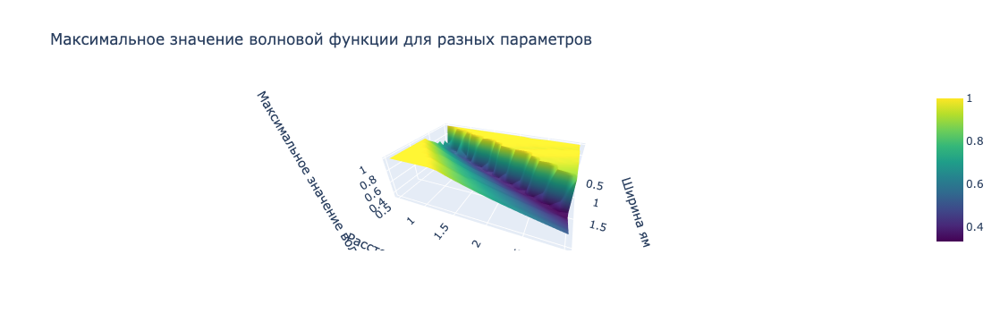

In [94]:
import numpy as np
import plotly.graph_objects as go
from scipy.linalg import eigh_tridiagonal

# Функция для вычисления волновых функций и энергий
def calculate_wavefunctions_and_energies(a, d, V0, N, x_min, x_max):
    x = np.linspace(x_min, x_max, N)  # Координатная сетка
    dx = x[1] - x[0]  # Шаг сетки

    # Потенциал с двумя ямами
    V = np.zeros(N)
    V[np.abs(x + d/2) < a/2] = -V0  # Левая яма
    V[np.abs(x - d/2) < a/2] = -V0  # Правая яма

    # Построение матрицы Гамильтониана (разностный метод)
    diag = np.ones(N) / dx**2  # Главная диагональ (кинетическая энергия)
    off_diag = -0.5 * np.ones(N - 1) / dx**2  # Соседние элементы

    # Итоговая диагональ с учётом потенциала
    H_diag = -2 * diag + V

    # Решение уравнения Шрёдингера (нахождение собственных значений)
    E, psi = eigh_tridiagonal(H_diag, off_diag)

    # Нормируем волновые функции
    psi /= np.sqrt(dx)

    # Масштабируем волновые функции, чтобы их значения были на одном уровне с энергией
    scale_factor = np.max(np.abs(psi))  # Масштабируем волновые функции
    psi_scaled = psi / scale_factor  # Нормализуем для корректного масштаба

    return x, V, E, psi_scaled

# Параметры
V0 = 50  # Глубина ям
N = 500  # Увеличено количество точек для более плавного графика
x_min, x_max = -5, 5  # Границы области моделирования
widths = np.linspace(0.5, 2.0, 20)  # Увеличено количество значений для ширины ям
distances = np.linspace(0.5, 3.0, 20)  # Увеличено количество значений для расстояний между ямами

# Подготовка для 3D графика
X, Y = np.meshgrid(widths, distances)  # Сетка для ширины ямы и расстояния между ямами

# Массив для хранения значений волновых функций
Z = np.zeros(X.shape)

# Рассчитываем значения для каждого сочетания ширины ямы и расстояния
for i, width in enumerate(widths):
    for j, distance in enumerate(distances):
        # Расчёт волновых функций и потенциала для текущих параметров
        x, V, E, psi_scaled = calculate_wavefunctions_and_energies(width, distance, V0, N, x_min, x_max)
        
        # Заполнение массива Z значениями для волновой функции (например, для первого состояния)
        Z[i, j] = np.max(psi_scaled[:, 0])  # Пример для первой волновой функции

# Создание 3D графика
fig = go.Figure(data=[go.Surface(z=Z, x=X, y=Y, colorscale='Viridis')])

# Настройки макета
fig.update_layout(
    title='Максимальное значение волновой функции для разных параметров',
    scene=dict(
        xaxis_title='Ширина ям (a)',
        yaxis_title='Расстояние между ямами (d)',
        zaxis_title='Максимальное значение волновой функции'
    ),
    autosize=True
)

# Показать график
fig.show()

# 5. Исследование локализованных состояний в системе из 3 одномерных прямоугольных потенциальных ям.

Для d = 0.50, разница энергий ΔE = 3.82e+00 (проверка на туннелирование)
Для d = 1.00, разница энергий ΔE = 2.95e-01 (проверка на туннелирование)
Для d = 1.50, разница энергий ΔE = 2.65e-03 (проверка на туннелирование)
Для d = 2.00, разница энергий ΔE = 2.34e-05 (проверка на туннелирование)
Для d = 2.50, разница энергий ΔE = 2.24e-01 (проверка на туннелирование)
Для d = 3.00, разница энергий ΔE = 2.24e-01 (проверка на туннелирование)


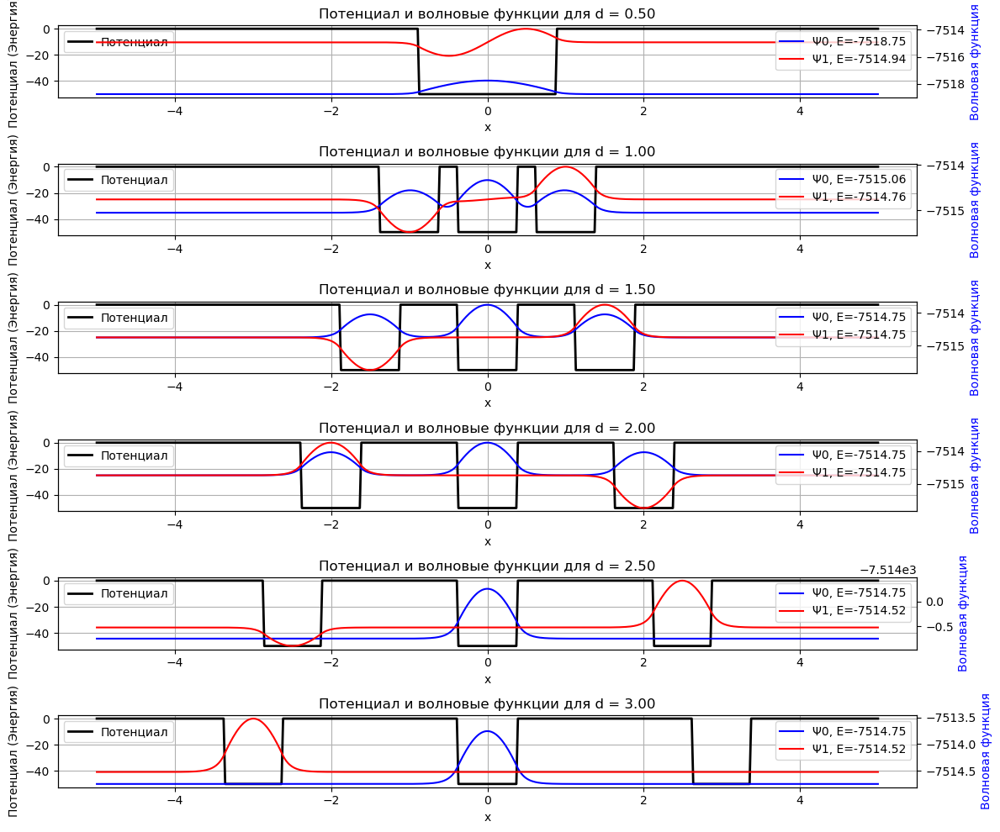

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.linalg import eigh_tridiagonal

# Функция для вычисления волновых функций и энергий
def calculate_wavefunctions_and_energies(a, d, V0, N, x_min, x_max):
    x = np.linspace(x_min, x_max, N)  # Координатная сетка
    dx = x[1] - x[0]  # Шаг сетки

    # Потенциал с тремя ямами
    V = np.zeros(N)
    
    # Вычисление смещений для каждой ямы
    center_shift = d  # Расстояние между ямами
    V[np.abs(x + center_shift) < a/2] = -V0  # Левая яма
    V[np.abs(x) < a/2] = -V0  # Центральная яма
    V[np.abs(x - center_shift) < a/2] = -V0  # Правая яма

    # Построение матрицы Гамильтониана (разностный метод)
    diag = np.ones(N) / dx**2  # Главная диагональ (кинетическая энергия)
    off_diag = -0.5 * np.ones(N - 1) / dx**2  # Соседние элементы

    # Итоговая диагональ с учётом потенциала
    H_diag = -2 * diag + V

    # Решение уравнения Шрёдингера (нахождение собственных значений)
    E, psi = eigh_tridiagonal(H_diag, off_diag)

    # Нормируем волновые функции
    psi /= np.sqrt(dx)

    # Масштабируем волновые функции, чтобы их значения были на одном уровне с энергией
    scale_factor = np.max(np.abs(psi))  # Масштабируем волновые функции
    psi_scaled = psi / scale_factor  # Нормализуем для корректного масштаба

    return x, V, E, psi_scaled

# Параметры
a = 0.75  # Ширина ям
V0 = 50  # Глубина ям
N = 500  # Число дискретных точек
x_min, x_max = -5, 5  # Границы области моделирования

# Различные расстояния между ямами для исследования туннелирования
distances = np.linspace(0.5, 3.0, 6)

# Подготовка графиков
fig, axes = plt.subplots(len(distances), 1, figsize=(12, 10))

for i, d in enumerate(distances):
    # Расчёт для текущего расстояния между ямами
    x, V, E, psi_scaled = calculate_wavefunctions_and_energies(a, d, V0, N, x_min, x_max)

    # График потенциала и волновых функций
    ax = axes[i]
    
    # График потенциала
    ax.plot(x, V, 'k', label="Потенциал", linewidth=2)
    ax.set_xlabel("x")
    ax.set_ylabel("Потенциал (Энергия)", color='k')
    
    # Создание второй оси для волновых функций
    ax2 = ax.twinx()
    ax2.plot(x, psi_scaled[:, 0] + E[0], label=f"Ψ0, E={E[0]:.2f}", color='b')
    ax2.plot(x, psi_scaled[:, 1] + E[1], label=f"Ψ1, E={E[1]:.2f}", color='r')
    
    # Настройка второй оси
    ax2.set_ylabel("Волновая функция", color='b')
    
    # Заголовок для каждого расстояния
    ax.set_title(f"Потенциал и волновые функции для d = {d:.2f}")
    ax.grid(True)
    
    # Легенды для обоих графиков
    ax.legend(loc='upper left')
    ax2.legend(loc='upper right')

    # Вывод разницы энергий для первого и второго состояний
    delta_E = E[1] - E[0]
    print(f"Для d = {d:.2f}, разница энергий ΔE = {delta_E:.2e} (проверка на туннелирование)")

plt.tight_layout()
plt.show()

# 6. Исследование локализованных состояний в системе из нескольких одномерных прямоугольных потенциальных ям.

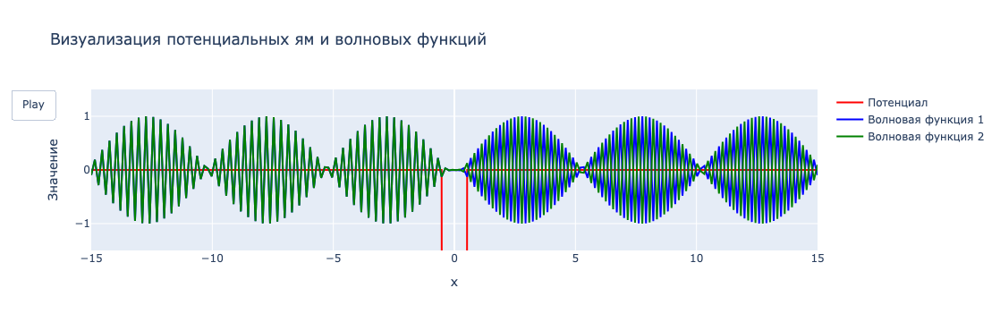

In [20]:
import numpy as np
import plotly.graph_objects as go
from scipy.sparse.linalg import eigsh

# Функция для вычисления волновых функций и энергий
def calculate_wavefunctions_and_energies(a, d, V0, N, x_min, x_max, num_wells, well_centers):
    x = np.linspace(x_min, x_max, N)  # Координатная сетка
    dx = x[1] - x[0]  # Шаг сетки

    # Потенциал с несколькими ямами
    V = np.zeros(N)
    
    # Распределяем ямы на разных расстояниях
    for i in range(num_wells):
        center = well_centers[i]  # Центры ям
        V[np.abs(x - center) < a/2] = -V0  # Яма

    # Построение матрицы Гамильтониана (разностный метод)
    diag = np.ones(N) / dx**2  # Главная диагональ (кинетическая энергия)
    off_diag = -0.5 * np.ones(N - 1) / dx**2  # Соседние элементы

    # Итоговая диагональ с учётом потенциала
    H_diag = -2 * diag + V

    # Используем eigsh для поиска собственных значений и функций
    E, psi = eigsh(-2 * np.diag(diag) + np.diag(off_diag, 1) + np.diag(off_diag, -1) + np.diag(V), k=6, which='SM')

    # Нормируем волновые функции
    psi /= np.sqrt(dx)

    # Масштабируем волновые функции, чтобы их значения были на одном уровне с энергией
    scale_factor = np.max(np.abs(psi))  # Масштабируем волновые функции
    psi_scaled = psi / scale_factor  # Нормализуем для корректного масштаба

    return x, V, E, psi_scaled

# Параметры
V0 = 50  # Глубина ям
N = 200  # Увеличено количество точек для более плавного графика
x_min, x_max = -15, 15  # Увеличили границы области моделирования для большего пространства
widths = 1  # Ширина ям
initial_distance = 2  # Начальное расстояние между ямами
num_steps = 30  # Увеличиваем количество шагов для плавности анимации

# Подготовка данных для анимации
frames_data = []

# Создаём начальный график
fig = go.Figure()

# Начальная линия для потенциала (пустой)
fig.add_trace(go.Scatter(x=np.linspace(x_min, x_max, N), y=np.zeros(N), mode='lines', name='Потенциал', line=dict(color='red')))
# Начальная линия для волновой функции
fig.add_trace(go.Scatter(x=np.linspace(x_min, x_max, N), y=np.zeros(N), mode='lines', name='Волновая функция 1', line=dict(color='blue')))
fig.add_trace(go.Scatter(x=np.linspace(x_min, x_max, N), y=np.zeros(N), mode='lines', name='Волновая функция 2', line=dict(color='green')))

# Настройки осей
fig.update_layout(
    title='Визуализация потенциальных ям и волновых функций',
    xaxis_title='x',
    yaxis_title='Значение',
    xaxis=dict(range=[x_min, x_max]),
    yaxis=dict(range=[-1.5, 1.5]),
    updatemenus=[dict(
        type='buttons',
        showactive=False,
        buttons=[dict(label='Play',
                      method='animate',
                      args=[None, dict(frame=dict(duration=100, redraw=True), fromcurrent=True)])]
    )]
)

# Создаём кадры для анимации
frames = []
for num_wells in range(1, 7):  # Для 1-6 ям
    # Массив, который хранит положение центров ям
    well_centers = np.zeros(num_wells)
    
    # Расставляем ямы по разным сторонам (двигаются в разные стороны)
    for i in range(num_wells):
        if i % 2 == 0:
            well_centers[i] = initial_distance * i  # Двигаются вправо
        else:
            well_centers[i] = -initial_distance * (i + 1)  # Двигаются влево

    for step in range(1, num_steps + 1):  # Для каждого шага
        # Для каждого шага постепенно увеличиваем расстояние между ямами
        well_centers += (step * 0.3) * np.sign(well_centers)  # Двигаются в соответствующие стороны

        # Вычисляем потенциал и волновые функции для новых центров
        x, V, E, psi_scaled = calculate_wavefunctions_and_energies(widths, 1, V0, N, x_min, x_max, num_wells, well_centers)

        # Добавляем кадры, чтобы оба состояния (волновые функции) отображались
        frames.append(go.Frame(
            data=[go.Scatter(x=x, y=V, mode='lines', name='Потенциал', line=dict(color='red')),
                  go.Scatter(x=x, y=psi_scaled[:, 0], mode='lines', name='Волновая функция 1', line=dict(color='blue')),
                  go.Scatter(x=x, y=psi_scaled[:, 1], mode='lines', name='Волновая функция 2', line=dict(color='green'))],
            name=f'frame_{num_wells}_{step}'
        ))

# Добавляем кадры в график
fig.frames = frames

# Показать график
fig.show()

Для d = 0.50, 4 ям, разница энергий ΔE = 2.47e+00 (проверка на туннелирование)
Для d = 0.50, 5 ям, разница энергий ΔE = 1.68e+00 (проверка на туннелирование)
Для d = 0.50, 6 ям, разница энергий ΔE = 1.24e+00 (проверка на туннелирование)
Для d = 1.00, 4 ям, разница энергий ΔE = 2.05e-01 (проверка на туннелирование)
Для d = 1.00, 5 ям, разница энергий ΔE = 1.47e-01 (проверка на туннелирование)
Для d = 1.00, 6 ям, разница энергий ΔE = 1.45e-01 (проверка на туннелирование)
Для d = 1.50, 4 ям, разница энергий ΔE = 1.68e-03 (проверка на туннелирование)
Для d = 1.50, 5 ям, разница энергий ΔE = 2.64e-03 (проверка на туннелирование)
Для d = 1.50, 6 ям, разница энергий ΔE = 1.18e-11 (проверка на туннелирование)
Для d = 2.00, 4 ям, разница энергий ΔE = 3.31e-05 (проверка на туннелирование)
Для d = 2.00, 5 ям, разница энергий ΔE = 2.34e-05 (проверка на туннелирование)
Для d = 2.00, 6 ям, разница энергий ΔE = 3.31e-05 (проверка на туннелирование)
Для d = 2.50, 4 ям, разница энергий ΔE = 9.09e-13 (п

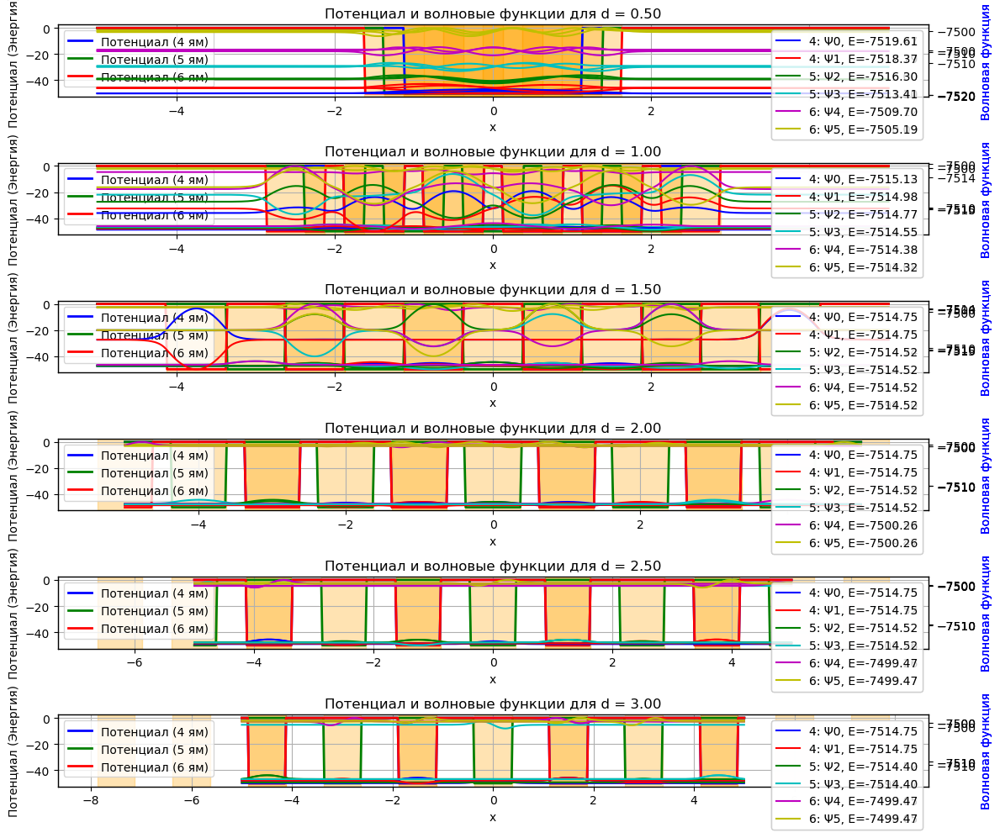

In [47]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.linalg import eigh_tridiagonal

# Функция для вычисления волновых функций и энергий
def calculate_wavefunctions_and_energies(a, d, V0, N, x_min, x_max, num_wells):
    x = np.linspace(x_min, x_max, N)  # Координатная сетка
    dx = x[1] - x[0]  # Шаг сетки

    # Потенциал с num_wells ямами
    V = np.zeros(N)

    # Расположение ям
    center_shift = d  # Расстояние между ямами
    for i in range(num_wells):
        shift = (i - (num_wells - 1) / 2) * center_shift  # Центр текущей ямы
        V[np.abs(x - shift) < a / 2] = -V0  # Добавляем яму в этот интервал

    # Построение матрицы Гамильтониана (разностный метод)
    diag = np.ones(N) / dx**2  # Главная диагональ (кинетическая энергия)
    off_diag = -0.5 * np.ones(N - 1) / dx**2  # Соседние элементы

    # Итоговая диагональ с учётом потенциала
    H_diag = -2 * diag + V

    # Решение уравнения Шрёдингера (нахождение собственных значений)
    E, psi = eigh_tridiagonal(H_diag, off_diag)

    # Нормируем волновые функции
    psi /= np.sqrt(dx)

    # Масштабируем волновые функции, чтобы их значения были на одном уровне с энергией
    scale_factor = np.max(np.abs(psi))  # Масштабируем волновые функции
    psi_scaled = psi / scale_factor  # Нормализуем для корректного масштаба

    return x, V, E, psi_scaled

# Параметры
a = 0.75  # Ширина ям
V0 = 50  # Глубина ям
N = 500  # Число дискретных точек
x_min, x_max = -5, 5  # Границы области моделирования

# Различные расстояния между ямами для исследования туннелирования
distances = np.linspace(0.5, 3.0, 6)

# Подготовка графиков
fig, axes = plt.subplots(len(distances), 1, figsize=(12, 10))

# Цвета для разных количества ям
colors = ['b', 'g', 'r', 'c', 'm', 'y']  # Список цветов для разных num_wells

# Цвета для состояний
state_colors = ['b', 'r', 'g', 'c', 'm', 'y']  # Список цветов для состояний (для волновых функций)

# Проведение расчётов для разных количеств ям
for i, d in enumerate(distances):
    for idx, num_wells in enumerate([4, 5, 6]):  # Число ям для исследования
        # Расчёт для текущего расстояния между ямами и количества ям
        x, V, E, psi_scaled = calculate_wavefunctions_and_energies(a, d, V0, N, x_min, x_max, num_wells)

        # График потенциала
        ax = axes[i]
        
        # График потенциала с разными цветами для num_wells
        ax.plot(x, V, color=colors[idx], label=f"Потенциал ({num_wells} ям)", linewidth=2)
        
        # Выделяем ямы разными цветами
        center_shift = d
        for j in range(num_wells):
            shift = (j - (num_wells - 1) / 2) * center_shift  # Центр текущей ямы
            ax.axvspan(shift - a / 2, shift + a / 2, color='orange', alpha=0.3)  # Закрашиваем область ямы

        ax.set_xlabel("x")
        ax.set_ylabel("Потенциал (Энергия)", color='k')
        
        # Создание второй оси для волновых функций
        ax2 = ax.twinx()

        # Отображение волновых функций с разными цветами для состояний
        opa = 4
        for state_idx in range(min(6, psi_scaled.shape[1])):  # Ограничиваемся максимум 6 состояниями
            ax2.plot(x, psi_scaled[:, state_idx] + E[state_idx], label=f"{int(opa)}: Ψ{state_idx}, E={E[state_idx]:.2f}", color=state_colors[state_idx])
            opa+=0.5
        
        # Настройка второй оси
        ax2.set_ylabel("Волновая функция", color='b')
        
        # Заголовок для каждого расстояния
        ax.set_title(f"Потенциал и волновые функции для d = {d:.2f}")
        ax.grid(True)
        
        # Легенды для обоих графиков
        ax.legend(loc='upper left')
        ax2.legend(loc='upper right')

        # Вывод разницы энергий для первого и второго состояний
        delta_E = E[1] - E[0]
        print(f"Для d = {d:.2f}, {num_wells} ям, разница энергий ΔE = {delta_E:.2e} (проверка на туннелирование)")

plt.tight_layout()
plt.show()

# 7. Приближённая модель периодического потенциала (ловушки).

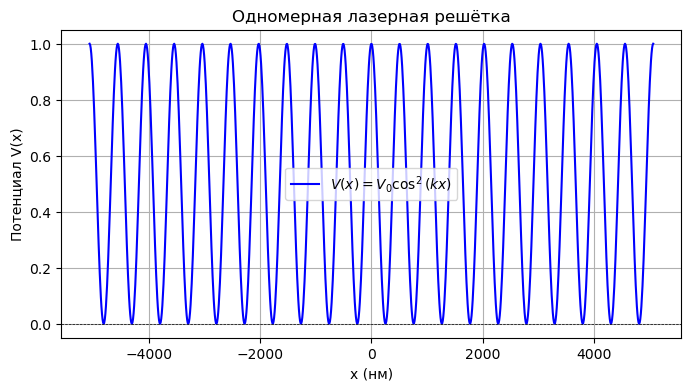

In [48]:
import numpy as np
import matplotlib.pyplot as plt

# Заданные параметры
lambda_laser = 1012e-9  # Длина волны лазера в метрах
k = 2 * np.pi / lambda_laser  # Волновой вектор
V0 = 1  # Условная глубина потенциала (относительная величина)

# Диапазон значений x (одномерное пространство)
x = np.linspace(-5 * lambda_laser, 5 * lambda_laser, 1000)  # 10 периодов решётки

# Потенциал лазерной решётки
V_x = V0 * np.cos(k * x)**2

# Построение графика
plt.figure(figsize=(8, 4))
plt.plot(x * 1e9, V_x, label=r'$V(x) = V_0 \cos^2(kx)$', color='b')  # Переводим x в нм
plt.axhline(0, color='black', linewidth=0.5, linestyle="--")
plt.xlabel("x (нм)")
plt.ylabel("Потенциал V(x)")
plt.title("Одномерная лазерная решётка")
plt.legend()
plt.grid()

plt.show()

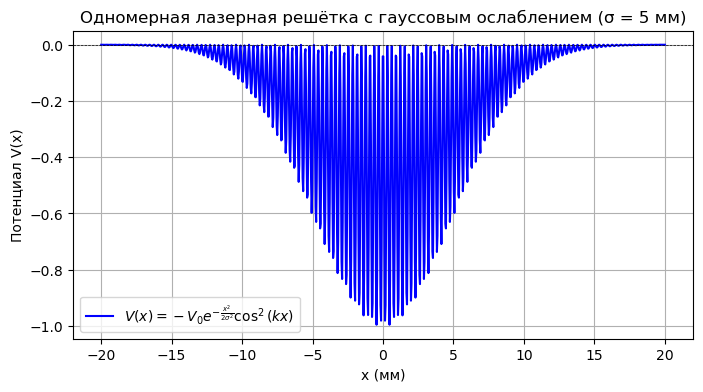

In [51]:
import numpy as np
import matplotlib.pyplot as plt

# Заданные параметры
lambda_laser = 1012e-9  # Длина волны лазера в метрах
k = 2 * np.pi / lambda_laser  # Волновой вектор
V0 = 1  # Условная глубина потенциала (относительная величина)
sigma = 5e-3  # Характерная ширина пучка (5 мм в метрах)

# Диапазон значений x (одномерное пространство)
x = np.linspace(-4 * sigma, 4 * sigma, 1000)  # 30 раз ширины пучка

# Потенциал лазерной решётки с гауссовым ослаблением по краям
V_x = -V0 * np.exp(-x**2 / (2 * sigma**2)) * np.cos(k * x)**2

# Построение графика
plt.figure(figsize=(8, 4))
plt.plot(x * 1e3, V_x, label=r'$V(x) = -V_0 e^{- \frac{x^2}{2\sigma^2}} \cos^2(kx)$', color='b')  # Переводим x в мм
plt.axhline(0, color='black', linewidth=0.5, linestyle="--")
plt.xlabel("x (мм)")
plt.ylabel("Потенциал V(x)")
plt.title("Одномерная лазерная решётка с гауссовым ослаблением (σ = 5 мм)")
plt.legend()
plt.grid()

plt.show()

## Аналитический метод

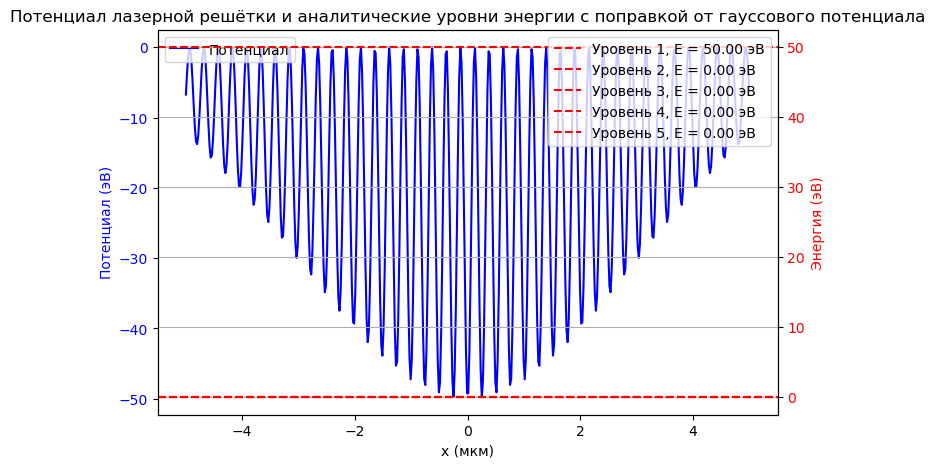

In [218]:
import numpy as np
import matplotlib.pyplot as plt

# Физические константы
hbar = 1.0545718e-34  # Дж·с
m = 9.10938356e-31  # кг (масса электрона)
eV_to_J = 1.60218e-19  # Дж в эВ

# Параметры ловушки
lambda_laser = 1012e-9  # м (длина волны лазера)
k = 2 * np.pi / (lambda_laser / 2)  # Волновой вектор
V0 = 50 * eV_to_J  # Глубина потенциальной ямы (50 эВ)
sigma = 3e-6  # м (ширина гауссового ослабления)

# Пространственная сетка
L = 10e-6  # м (размер области)
N = 500  # число узлов сетки
x = np.linspace(-L / 2, L / 2, N)

# Потенциал (аппроксимация синусом с гауссовым ослаблением)
V = -V0 * np.cos(k * x)**2 * np.exp(-x**2 / (2 * sigma**2))  # Потенциал в Дж

# Численные уровни энергии, используя приближенные методы
n_levels = 5
en_analytic = []

# Подход для вычисления энергии с учётом влияния потенциала
for n in range(n_levels):
    # Энергия для уровня n: поправка от гауссового потенциала
    E_n = (hbar**2 * (n + 0.5)**2 * np.pi**2) / (2 * m * L**2)  # Энергия без поправки
    # Поправка от гауссового потенциала, приблизительно
    correction = V0 * np.exp(-(n**2) / (2 * sigma**2))  # Моделируем поправку на потенциал
    E_n += correction  # Прибавляем поправку к энергии
    en_analytic.append(E_n / eV_to_J)  # Переводим в эВ

en_analytic = np.array(en_analytic)

# Визуализация
fig, ax1 = plt.subplots(figsize=(8, 5))

# Основная ось для потенциала
ax1.plot(x * 1e6, V / eV_to_J, label='Потенциал', color='blue')
ax1.set_xlabel('x (мкм)')
ax1.set_ylabel('Потенциал (эВ)', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Вторая ось для уровней энергии
ax2 = ax1.twinx()
for i, E in enumerate(en_analytic):
    ax2.axhline(E, linestyle='dashed', color='red', label=f'Уровень {i+1}, E = {E:.2f} эВ')

ax2.set_ylabel('Энергия (эВ)', color='red')
ax2.tick_params(axis='y', labelcolor='red')

# Настройка графика
plt.title('Потенциал лазерной решётки и аналитические уровни энергии с поправкой от гауссового потенциала')
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.grid(True)
plt.show()

## Вариационный метод

Первые 5 уровней энергии (эВ): [-49.77784302 -49.77784302 -49.22956911 -49.22937937 -49.08825529]


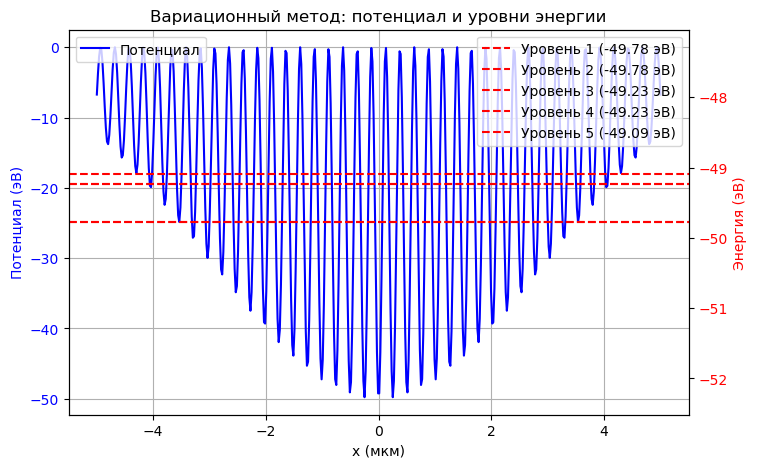

In [217]:
import numpy as np
import matplotlib.pyplot as plt

# Физические константы
hbar = 1.0545718e-34  # Дж·с
m = 9.10938356e-31  # кг (масса электрона)
eV_to_J = 1.60218e-19  # Дж в эВ

# Параметры ловушки
lambda_laser = 1012e-9  # м (длина волны лазера)
k = 2 * np.pi / (lambda_laser / 2)  # Волновой вектор
V0 = 50 * eV_to_J  # Глубина потенциальной ямы (50 эВ)
sigma = 3e-6  # м (ширина гауссового ослабления)

# Пространственная сетка
L = 10e-6  # м (размер области)
N = 500  # число узлов сетки
x = np.linspace(-L / 2, L / 2, N)

# Потенциал (аппроксимация синусом с гауссовым ослаблением)
V = -V0 * np.cos(k * x)**2 * np.exp(-x**2 / (2 * sigma**2))  # Потенциал в Дж

# Матричные элементы
def kinetic_term(x, dx, L):
    T = -0.5 * (hbar**2 / m)
    matrix = np.zeros((N, N))
    for i in range(N):
        for j in range(N):
            if i == j:
                matrix[i, j] = -2 / dx**2
            elif abs(i - j) == 1:
                matrix[i, j] = 1 / dx**2
    matrix *= T
    return matrix

def potential_term(x, V):
    return np.diag(V)

# Составляем полную матрицу Гамильтониана
dx = x[1] - x[0]
H_kin = kinetic_term(x, dx, L)
H_pot = potential_term(x, V)
H = H_kin + H_pot

# Решение для собственных уровней энергии
eigenvalues, eigenvectors = np.linalg.eigh(H)

# Печать первых 5 уровней энергии
eigenvalues = eigenvalues / eV_to_J  # Перевод в эВ
print("Первые 5 уровней энергии (эВ):", eigenvalues[:5])

# Визуализация
fig, ax1 = plt.subplots(figsize=(8, 5))

# Потенциал на первой оси
ax1.plot(x * 1e6, V / eV_to_J, label="Потенциал", color="blue")
ax1.set_xlabel('x (мкм)')
ax1.set_ylabel('Потенциал (эВ)', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Вторая ось для уровней энергии
ax2 = ax1.twinx()

# Отображаем уровни энергии
for i in range(5):
    ax2.axhline(y=eigenvalues[i], color='red', linestyle='--', label=f"Уровень {i+1} ({eigenvalues[i]:.2f} эВ)")

ax2.set_ylabel('Энергия (эВ)', color='red')
ax2.tick_params(axis='y', labelcolor='red')

# Добавление сетки и легенды
ax1.grid()
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.title('Вариационный метод: потенциал и уровни энергии')
plt.show()

## Численный метод

Первые 5 уровней энергии (эВ): [-49.77784302 -49.77784302 -49.22956911 -49.22937937 -49.08825529]


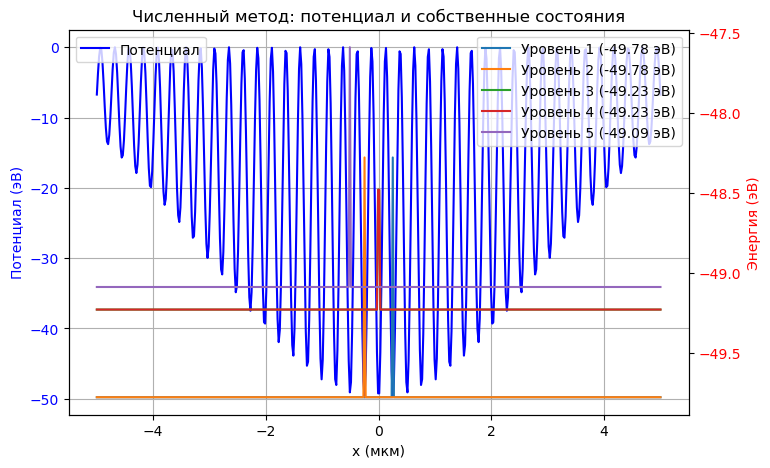

In [81]:
import numpy as np
import matplotlib.pyplot as plt

# Физические константы
hbar = 1.0545718e-34  # Дж·с
m = 9.10938356e-31  # кг (масса электрона)
eV_to_J = 1.60218e-19  # Дж в эВ

# Параметры ловушки
lambda_laser = 1012e-9  # м (длина волны лазера)
k = 2 * np.pi / (lambda_laser / 2)  # Волновой вектор
V0 = 50 * eV_to_J  # Глубина потенциальной ямы (50 эВ)
sigma = 3e-6  # м (ширина гауссового ослабления)

# Пространственная сетка
L = 10e-6  # м (размер области)
N = 500  # число узлов сетки
x = np.linspace(-L / 2, L / 2, N)
dx = x[1] - x[0]  # шаг по пространству

# Потенциал (аппроксимация синусом с гауссовым ослаблением)
V = -V0 * np.cos(k * x)**2 * np.exp(-x**2 / (2 * sigma**2))  # Потенциал в Дж

# Составляем разностную схему для уравнения Шрёдингера

# Кинетический оператор (второе производное по x, методом конечных разностей)
T = -0.5 * (hbar**2 / m) * (np.diag(np.ones(N-1), 1) - 2 * np.diag(np.ones(N), 0) + np.diag(np.ones(N-1), -1)) / dx**2

# Потенциальный оператор (просто диагональная матрица с потенциалом)
V_matrix = np.diag(V)

# Полный Гамильтониан
H = T + V_matrix

# Решаем собственное уравнение для Гамильтониана
eigenvalues, eigenvectors = np.linalg.eigh(H)

# Печать первых 5 уровней энергии
eigenvalues = eigenvalues / eV_to_J  # Перевод в эВ
print("Первые 5 уровней энергии (эВ):", eigenvalues[:5])

# Визуализация с использованием twinx
fig, ax1 = plt.subplots(figsize=(8, 5))

# Потенциал на первой оси
ax1.plot(x * 1e6, V / eV_to_J, label="Потенциал", color="blue")
ax1.set_xlabel('x (мкм)')
ax1.set_ylabel('Потенциал (эВ)', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Вторая ось для уровней энергии
ax2 = ax1.twinx()

# Увеличиваем множитель для выделения пиков
scaling_factor = 1.5

# Отображаем уровни энергии с собственными волновыми функциями
for i in range(5):
    ax2.plot(x * 1e6, eigenvectors[:, i]**2 * scaling_factor + eigenvalues[i], label=f"Уровень {i+1} ({eigenvalues[i]:.2f} эВ)")

ax2.set_ylabel('Энергия (эВ)', color='red')
ax2.tick_params(axis='y', labelcolor='red')

# Добавление сетки и легенды
ax1.grid()
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.title('Численный метод: потенциал и собственные состояния')
plt.show()

# 8. Распределение атомов по уровням в одной потенциальной яме с учётом температуры.

# 1 яма

The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.


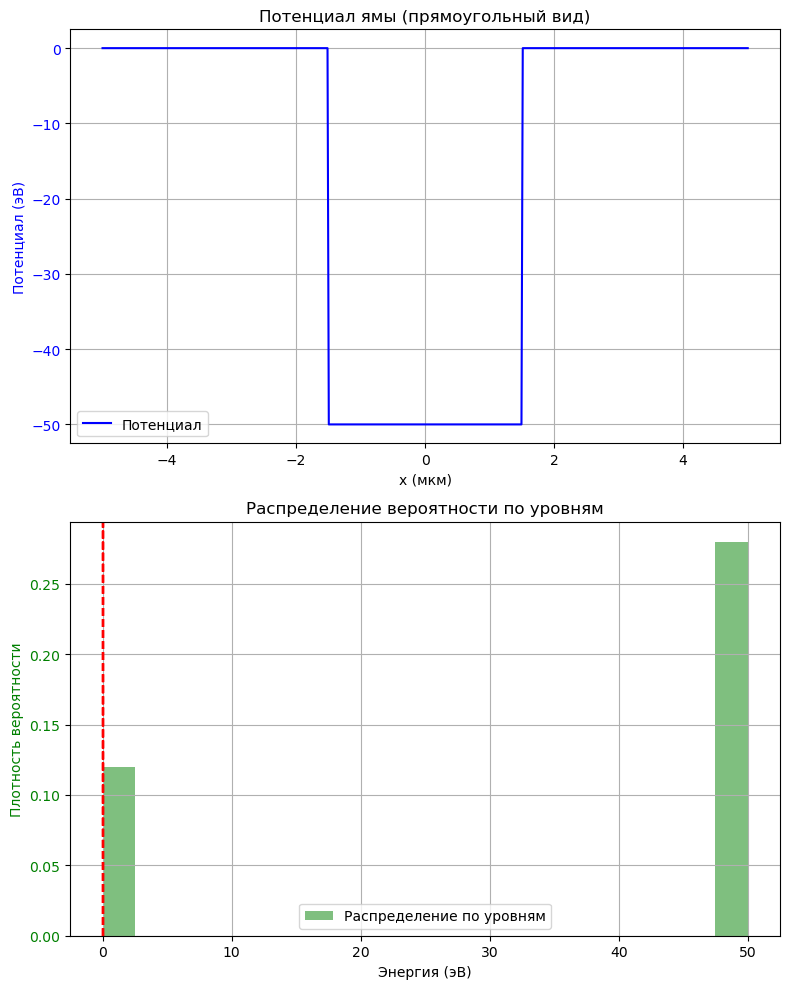

In [123]:
import numpy as np
import matplotlib.pyplot as plt

# Физические константы
hbar = 1.0545718e-34  # Дж·с
m = 9.10938356e-31  # кг (масса электрона)
eV_to_J = 1.60218e-19  # Дж в эВ

# Параметры ловушки
V0 = 50 * eV_to_J  # Глубина потенциальной ямы (50 эВ)
L_well = 3e-6  # м (ширина прямоугольной ямы)
L = 10e-6  # м (размер области)
N = 500  # число узлов сетки

# Пространственная сетка
x = np.linspace(-L / 2, L / 2, N)

# Потенциал (прямоугольная яма)
V = np.zeros_like(x)
V[np.abs(x) < L_well / 2] = -V0  # Внутри ямы потенциал = -V0

# Матрица для вычисления второй производной (конечные разности)
dx = x[1] - x[0]
T = - (hbar**2 / (2 * m)) * (np.diag(-2 * np.ones(N)) + np.diag(np.ones(N-1), 1) + np.diag(np.ones(N-1), -1)) / dx**2

# Потенциальная энергия
V_matrix = np.diag(V)

# Гамильтониан
H = T + V_matrix

# Решение задачи на собственные значения энергии
energies, wavefunctions = np.linalg.eigh(H)

# Преобразуем энергии в эВ
energies_eV = energies / eV_to_J

# Изменение масштаба уровней
energies_eV -= np.min(energies_eV)  # Сдвиг, чтобы уровни начинались от нуля

# Визуализация
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 10))

# 1. Потенциал на графике (основная ось)
ax1.plot(x * 1e6, V / eV_to_J, label='Потенциал', color='blue')
ax1.set_xlabel('x (мкм)')
ax1.set_ylabel('Потенциал (эВ)', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Легенда и сетка
ax1.set_title(f'Потенциал ямы (прямоугольный вид)')
ax1.legend()
ax1.grid(True)

# 2. Энергетические уровни и распределение
ax2.hist(energies_eV, bins=20, density=True, alpha=0.5, color='green', label='Распределение по уровням')
for E in energies_eV[:10]:  # Отображаем первые 10 уровней
    ax2.axvline(E, color='red', linestyle='dashed')
ax2.set_xlabel('Энергия (эВ)')
ax2.set_ylabel('Плотность вероятности', color='green')
ax2.tick_params(axis='y', labelcolor='green')

# Легенда и сетка
ax2.set_title('Распределение вероятности по уровням')
ax2.legend()
ax2.grid(True)

# Отображаем
plt.tight_layout()
plt.show()

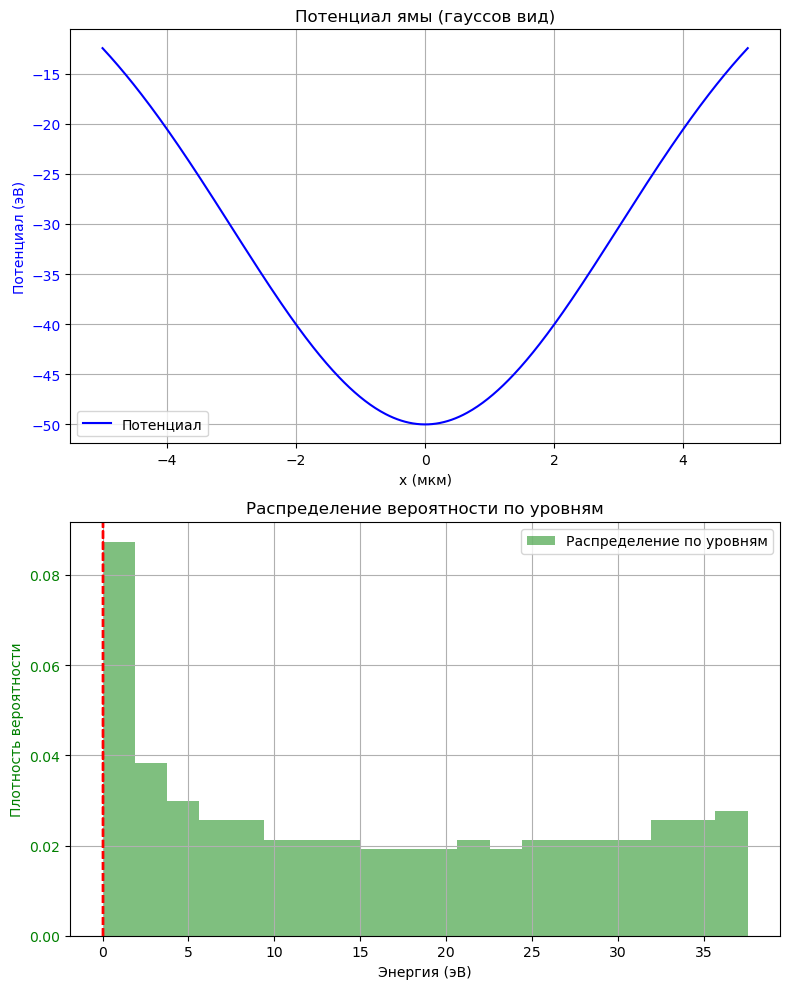

In [122]:
import numpy as np
import matplotlib.pyplot as plt

# Физические константы
hbar = 1.0545718e-34  # Дж·с
m = 9.10938356e-31  # кг (масса электрона)
eV_to_J = 1.60218e-19  # Дж в эВ
k_B = 1.380649e-23  # Дж/К (постоянная Больцмана)

# Параметры ловушки
V0 = 50 * eV_to_J  # Глубина потенциальной ямы (50 эВ)
sigma = 3e-6  # м (ширина гауссового ослабления)

# Пространственная сетка
L = 10e-6  # м (размер области)
N = 500  # число узлов сетки
x = np.linspace(-L / 2, L / 2, N)

# Потенциал (гауссовая яма)
V = -V0 * np.exp(-x**2 / (2 * sigma**2))  # Потенциал в Дж

# Матрица для вычисления второй производной (конечные разности)
dx = x[1] - x[0]
T = - (hbar**2 / (2 * m)) * (np.diag(-2 * np.ones(N)) + np.diag(np.ones(N-1), 1) + np.diag(np.ones(N-1), -1)) / dx**2

# Потенциальная энергия
V_matrix = np.diag(V)

# Гамильтониан
H = T + V_matrix

# Решение задачи на собственные значения энергии
energies, wavefunctions = np.linalg.eigh(H)

# Преобразуем энергии в эВ
energies_eV = energies / eV_to_J

# Изменение масштаба уровней
energies_eV -= np.min(energies_eV)  # Сдвиг, чтобы уровни начинались от нуля

# Визуализация
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 10))

# 1. Потенциал на графике (основная ось)
ax1.plot(x * 1e6, V / eV_to_J, label='Потенциал', color='blue')
ax1.set_xlabel('x (мкм)')
ax1.set_ylabel('Потенциал (эВ)', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Легенда и сетка
ax1.set_title(f'Потенциал ямы (гауссов вид)')
ax1.legend()
ax1.grid(True)

# 2. Энергетические уровни и распределение
ax2.hist(energies_eV, bins=20, density=True, alpha=0.5, color='green', label='Распределение по уровням')
for E in energies_eV[:10]:  # Отображаем первые 10 уровней
    ax2.axvline(E, color='red', linestyle='dashed')
ax2.set_xlabel('Энергия (эВ)')
ax2.set_ylabel('Плотность вероятности', color='green')
ax2.tick_params(axis='y', labelcolor='green')

# Легенда и сетка
ax2.set_title('Распределение вероятности по уровням')
ax2.legend()
ax2.grid(True)

# Отображаем
plt.tight_layout()
plt.show()

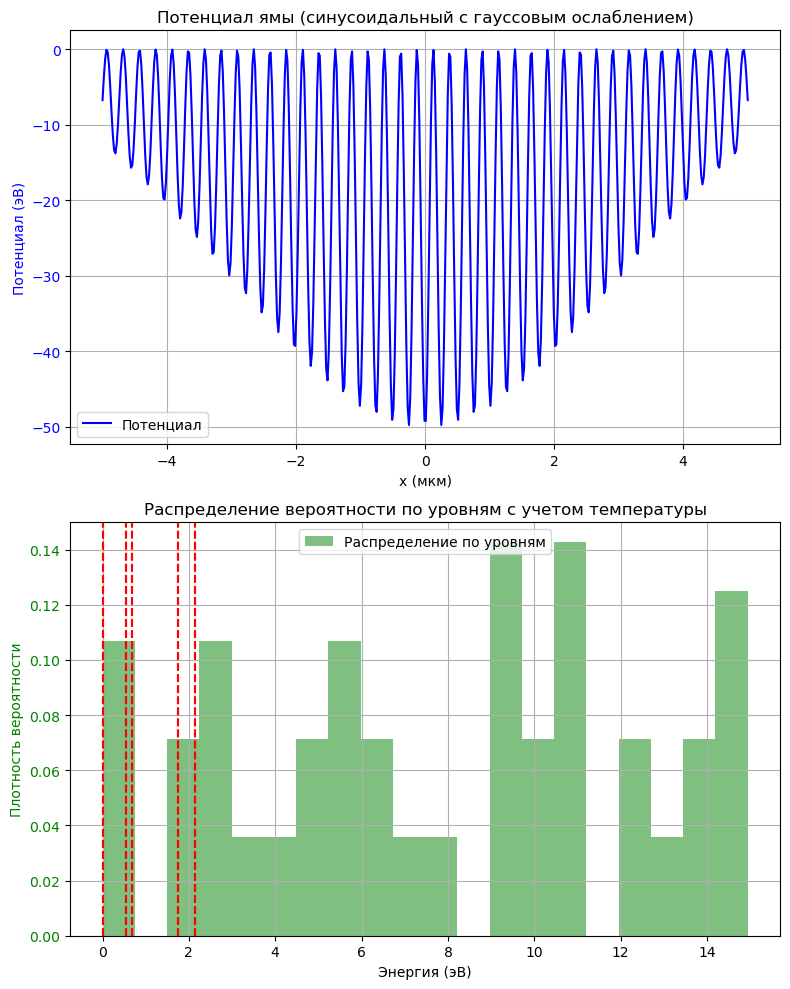

In [144]:
import numpy as np
import matplotlib.pyplot as plt

# Физические константы
hbar = 1.0545718e-34  # Дж·с
m = 9.10938356e-31  # кг (масса электрона)
eV_to_J = 1.60218e-19  # Дж в эВ
k_B = 1.380649e-23  # Дж/К (постоянная Больцмана)

# Параметры ловушки
lambda_laser = 1012e-9  # м (длина волны лазера)
k = 2 * np.pi / (lambda_laser / 2)  # Волновой вектор
V0 = 50 * eV_to_J  # Глубина потенциальной ямы (50 эВ)
sigma = 3e-6  # м (ширина гауссового ослабления)

# Пространственная сетка
L = 10e-6  # м (размер области)
N = 500  # число узлов сетки
x = np.linspace(-L / 2, L / 2, N)

# Потенциал (синусоидальная форма с гауссовым ослаблением)
V = -V0 * np.cos(k * x)**2 * np.exp(-x**2 / (2 * sigma**2))  # Потенциал в Дж

# Матрица для вычисления второй производной (конечные разности)
dx = x[1] - x[0]
T = - (hbar**2 / (2 * m)) * (np.diag(-2 * np.ones(N)) + np.diag(np.ones(N-1), 1) + np.diag(np.ones(N-1), -1)) / dx**2

# Потенциальная энергия
V_matrix = np.diag(V)

# Гамильтониан
H = T + V_matrix

# Решение задачи на собственные значения энергии
energies, wavefunctions = np.linalg.eigh(H)

# Преобразуем энергии в эВ
energies_eV = energies / eV_to_J

# Сдвигаем энергии, чтобы минимальный уровень был равен нулю
energies_eV -= np.min(energies_eV)

# Увеличиваем количество уровней (например, до 200)
num_levels = 75  # Увеличиваем число уровней
energies_eV = energies_eV[:num_levels]  # Ограничиваем массив только нужными уровнями

# Задаем температуру в Кельвинах
T = 300  # Температура (например, 300 К)

# Статистический фактор Больцмана для каждого уровня
boltzmann_factors = np.exp(-energies_eV / (k_B * T))

# Нормируем фактор Больцмана, чтобы сумма вероятностей была равна 1
partition_function = np.sum(boltzmann_factors)
probabilities = boltzmann_factors / partition_function

# Визуализация
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 10))

# 1. Потенциал на графике (основная ось)
ax1.plot(x * 1e6, V / eV_to_J, label='Потенциал', color='blue')
ax1.set_xlabel('x (мкм)')
ax1.set_ylabel('Потенциал (эВ)', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Легенда и сетка
ax1.set_title(f'Потенциал ямы (синусоидальный с гауссовым ослаблением)')
ax1.legend()
ax1.grid(True)

# 2. Энергетические уровни и распределение
# Увеличиваем количество столбцов для гистограммы (например, 50 столбцов)
ax2.hist(energies_eV, bins=20, density=True, alpha=0.5, color='green', label='Распределение по уровням')  # Увеличиваем количество столбцов
for E, prob in zip(energies_eV[:10], probabilities[:10]):  # Отображаем первые 10 уровней с учетом вероятности
    ax2.axvline(E, color='red', linestyle='dashed')
    #ax2.text(E, 0.02, f'P={prob:.2f}', color='red', fontsize=8)

ax2.set_xlabel('Энергия (эВ)')
ax2.set_ylabel('Плотность вероятности', color='green')
ax2.tick_params(axis='y', labelcolor='green')

# Легенда и сетка
ax2.set_title('Распределение вероятности по уровням с учетом температуры')
ax2.legend()
ax2.grid(True)

# Отображаем
plt.tight_layout()
plt.show()

# 9. Влияние шума лазерного излучения и флуктуаций параметров

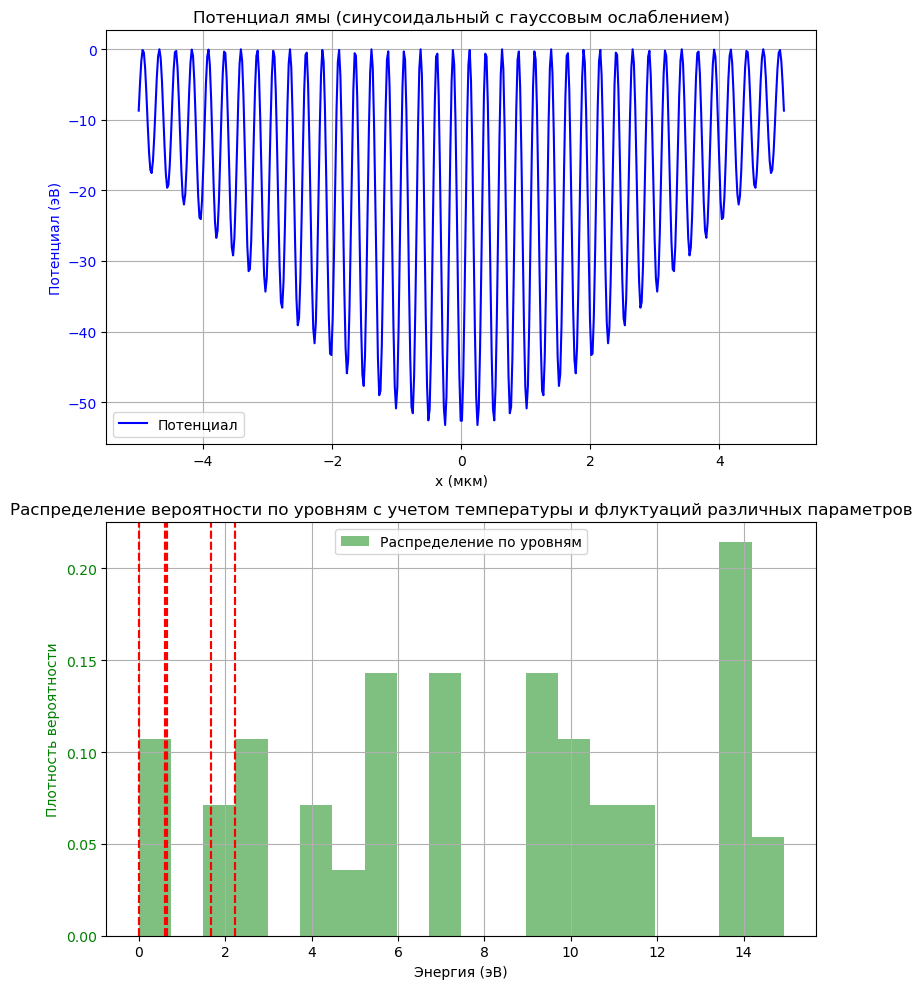

In [147]:
import numpy as np
import matplotlib.pyplot as plt

# Физические константы
hbar = 1.0545718e-34  # Дж·с
m = 9.10938356e-31  # кг (масса электрона)
eV_to_J = 1.60218e-19  # Дж в эВ
k_B = 1.380649e-23  # Дж/К (постоянная Больцмана)

# Параметры ловушки
lambda_laser = 1012e-9  # м (длина волны лазера)
k = 2 * np.pi / (lambda_laser / 2)  # Волновой вектор

# Добавляем флуктуации
V0_base = 50 * eV_to_J  # Глубина потенциальной ямы (50 эВ)
V0_fluctuation = 0.1 * V0_base  # Флуктуация величины V0 (10% от базового значения)
V0 = V0_base + np.random.uniform(-V0_fluctuation, V0_fluctuation)  # Флуктуации глубины ямы

sigma_base = 3e-6  # м (ширина гауссового ослабления)
sigma_fluctuation = 1e-6  # Флуктуация ширины (1 мкм)
sigma = sigma_base + np.random.uniform(-sigma_fluctuation, sigma_fluctuation)  # Флуктуации ширины гаусса

# Пространственная сетка
L = 10e-6  # м (размер области)
N = 500  # число узлов сетки
x = np.linspace(-L / 2, L / 2, N)

# Потенциал (синусоидальная форма с гауссовым ослаблением)
V = -V0 * np.cos(k * x)**2 * np.exp(-x**2 / (2 * sigma**2))  # Потенциал в Дж

# Матрица для вычисления второй производной (конечные разности)
dx = x[1] - x[0]
T = - (hbar**2 / (2 * m)) * (np.diag(-2 * np.ones(N)) + np.diag(np.ones(N-1), 1) + np.diag(np.ones(N-1), -1)) / dx**2

# Потенциальная энергия
V_matrix = np.diag(V)

# Гамильтониан
H = T + V_matrix

# Решение задачи на собственные значения энергии
energies, wavefunctions = np.linalg.eigh(H)

# Преобразуем энергии в эВ
energies_eV = energies / eV_to_J

# Сдвигаем энергии, чтобы минимальный уровень был равен нулю
energies_eV -= np.min(energies_eV)

# Увеличиваем количество уровней (например, до 200)
num_levels = 75  # Увеличиваем число уровней
energies_eV = energies_eV[:num_levels]  # Ограничиваем массив только нужными уровнями

# Задаем температуру в Кельвинах
T = 300  # Температура (например, 300 К)

# Статистический фактор Больцмана для каждого уровня
boltzmann_factors = np.exp(-energies_eV / (k_B * T))

# Нормируем фактор Больцмана, чтобы сумма вероятностей была равна 1
partition_function = np.sum(boltzmann_factors)
probabilities = boltzmann_factors / partition_function

# Визуализация
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 10))

# 1. Потенциал на графике (основная ось)
ax1.plot(x * 1e6, V / eV_to_J, label='Потенциал', color='blue')
ax1.set_xlabel('x (мкм)')
ax1.set_ylabel('Потенциал (эВ)', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Легенда и сетка
ax1.set_title(f'Потенциал ямы (синусоидальный с гауссовым ослаблением)')
ax1.legend()
ax1.grid(True)

# 2. Энергетические уровни и распределение
# Увеличиваем количество столбцов для гистограммы (например, 50 столбцов)
ax2.hist(energies_eV, bins=20, density=True, alpha=0.5, color='green', label='Распределение по уровням')  # Увеличиваем количество столбцов
for E, prob in zip(energies_eV[:10], probabilities[:10]):  # Отображаем первые 10 уровней с учетом вероятности
    ax2.axvline(E, color='red', linestyle='dashed')
    #ax2.text(E, 0.02, f'P={prob:.2f}', color='red', fontsize=8)

ax2.set_xlabel('Энергия (эВ)')
ax2.set_ylabel('Плотность вероятности', color='green')
ax2.tick_params(axis='y', labelcolor='green')

# Легенда и сетка
ax2.set_title('Распределение вероятности по уровням с учетом температуры и флуктуаций различных параметров')
ax2.legend()
ax2.grid(True)

# Отображаем
plt.tight_layout()
plt.show()

# 10. Тепловое движение атомов: эффект распределения скоростей на вероятность захвата.

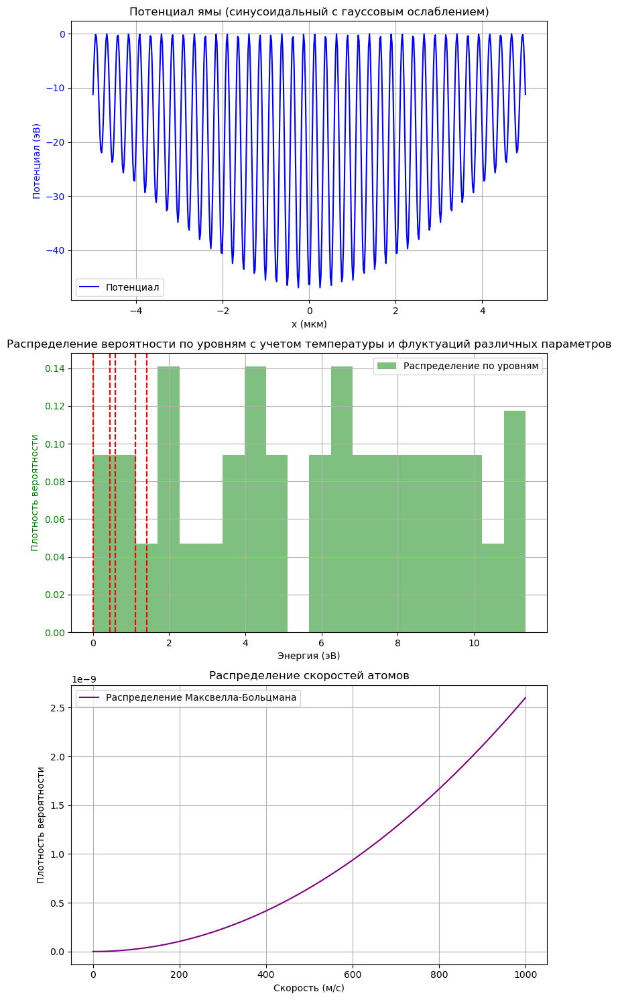

In [149]:
import numpy as np
import matplotlib.pyplot as plt

# Физические константы
hbar = 1.0545718e-34  # Дж·с
m = 9.10938356e-31  # кг (масса электрона)
eV_to_J = 1.60218e-19  # Дж в эВ
k_B = 1.380649e-23  # Дж/К (постоянная Больцмана)

# Параметры ловушки
lambda_laser = 1012e-9  # м (длина волны лазера)
k = 2 * np.pi / (lambda_laser / 2)  # Волновой вектор

# Добавляем флуктуации
V0_base = 50 * eV_to_J  # Глубина потенциальной ямы (50 эВ)
V0_fluctuation = 0.1 * V0_base  # Флуктуация величины V0 (10% от базового значения)
V0 = V0_base + np.random.uniform(-V0_fluctuation, V0_fluctuation)  # Флуктуации глубины ямы

sigma_base = 3e-6  # м (ширина гауссового ослабления)
sigma_fluctuation = 1e-6  # Флуктуация ширины (1 мкм)
sigma = sigma_base + np.random.uniform(-sigma_fluctuation, sigma_fluctuation)  # Флуктуации ширины гаусса

# Пространственная сетка
L = 10e-6  # м (размер области)
N = 500  # число узлов сетки
x = np.linspace(-L / 2, L / 2, N)

# Потенциал (синусоидальная форма с гауссовым ослаблением)
V = -V0 * np.cos(k * x)**2 * np.exp(-x**2 / (2 * sigma**2))  # Потенциал в Дж

# Матрица для вычисления второй производной (конечные разности)
dx = x[1] - x[0]
T = - (hbar**2 / (2 * m)) * (np.diag(-2 * np.ones(N)) + np.diag(np.ones(N-1), 1) + np.diag(np.ones(N-1), -1)) / dx**2

# Потенциальная энергия
V_matrix = np.diag(V)

# Гамильтониан
H = T + V_matrix

# Решение задачи на собственные значения энергии
energies, wavefunctions = np.linalg.eigh(H)

# Преобразуем энергии в эВ
energies_eV = energies / eV_to_J

# Сдвигаем энергии, чтобы минимальный уровень был равен нулю
energies_eV -= np.min(energies_eV)

# Увеличиваем количество уровней (например, до 200)
num_levels = 75  # Увеличиваем число уровней
energies_eV = energies_eV[:num_levels]  # Ограничиваем массив только нужными уровнями

# Задаем температуру в Кельвинах
T = 300  # Температура (например, 300 К)

# Статистический фактор Больцмана для каждого уровня
boltzmann_factors = np.exp(-energies_eV / (k_B * T))

# Нормируем фактор Больцмана, чтобы сумма вероятностей была равна 1
partition_function = np.sum(boltzmann_factors)
probabilities = boltzmann_factors / partition_function

# Тепловое движение атомов - распределение скоростей Максвелла-Больцмана
def maxwell_boltzmann_distribution(v, m, T):
    return (m / (2 * np.pi * k_B * T))**(3/2) * 4 * np.pi * v**2 * np.exp(-m * v**2 / (2 * k_B * T))

# Генерация случайных скоростей атомов (в метрах в секунду)
v_max = 1e3  # максимальная скорость (м/с)
velocities = np.linspace(0, v_max, 1000)
speed_distribution = maxwell_boltzmann_distribution(velocities, m, T)

# Визуализация
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(8, 15))

# 1. Потенциал на графике (основная ось)
ax1.plot(x * 1e6, V / eV_to_J, label='Потенциал', color='blue')
ax1.set_xlabel('x (мкм)')
ax1.set_ylabel('Потенциал (эВ)', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_title('Потенциал ямы (синусоидальный с гауссовым ослаблением)')
ax1.legend()
ax1.grid(True)

# 2. Энергетические уровни и распределение
ax2.hist(energies_eV, bins=20, density=True, alpha=0.5, color='green', label='Распределение по уровням')
for E, prob in zip(energies_eV[:10], probabilities[:10]):
    ax2.axvline(E, color='red', linestyle='dashed')

ax2.set_xlabel('Энергия (эВ)')
ax2.set_ylabel('Плотность вероятности', color='green')
ax2.tick_params(axis='y', labelcolor='green')
ax2.set_title('Распределение вероятности по уровням с учетом температуры и флуктуаций различных параметров')
ax2.legend()
ax2.grid(True)

# 3. Распределение скоростей атомов
ax3.plot(velocities, speed_distribution, label='Распределение Максвелла-Больцмана', color='purple')
ax3.set_xlabel('Скорость (м/с)')
ax3.set_ylabel('Плотность вероятности')
ax3.set_title('Распределение скоростей атомов')
ax3.legend()
ax3.grid(True)

# Отображаем
plt.tight_layout()
plt.show()

# 11. Введение случайных вариаций параметров (глубина ловушки, тепловые возмущения).

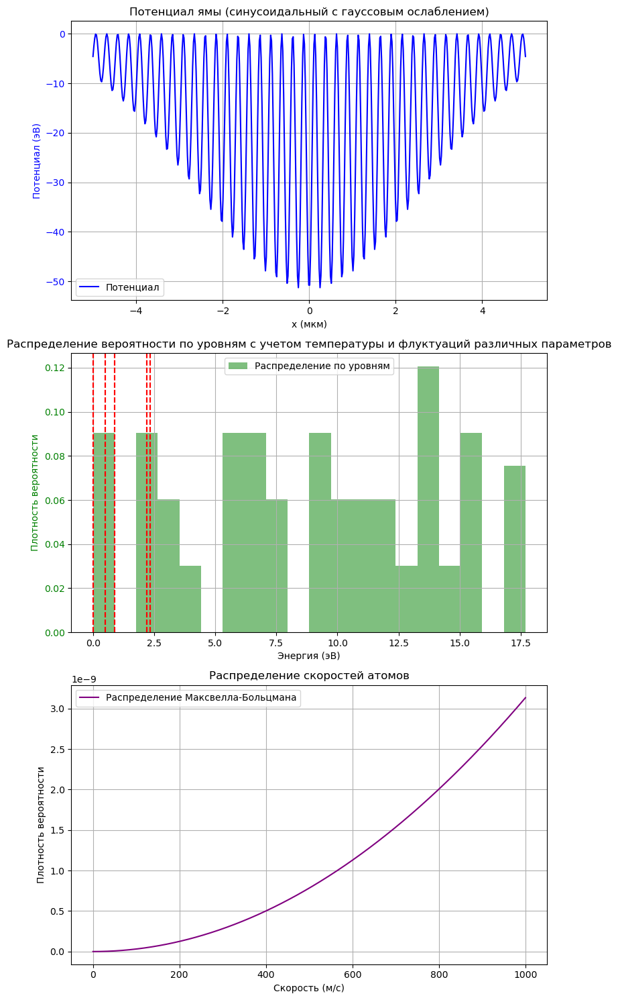

In [153]:
import numpy as np
import matplotlib.pyplot as plt

# Физические константы
hbar = 1.0545718e-34  # Дж·с
m = 9.10938356e-31  # кг (масса электрона)
eV_to_J = 1.60218e-19  # Дж в эВ
k_B = 1.380649e-23  # Дж/К (постоянная Больцмана)

# Параметры ловушки
lambda_laser = 1012e-9  # м (длина волны лазера)
k = 2 * np.pi / (lambda_laser / 2)  # Волновой вектор

# Добавляем флуктуации
V0_base = 50 * eV_to_J  # Глубина потенциальной ямы (50 эВ)
V0_fluctuation = 0.1 * V0_base  # Флуктуация величины V0 (10% от базового значения)
V0 = V0_base + np.random.uniform(-V0_fluctuation, V0_fluctuation)  # Флуктуации глубины ямы

sigma_base = 3e-6  # м (ширина гауссового ослабления)
sigma_fluctuation = 1e-6  # Флуктуация ширины (1 мкм)
sigma = sigma_base + np.random.uniform(-sigma_fluctuation, sigma_fluctuation)  # Флуктуации ширины гаусса

# Добавляем флуктуации температуры (в пределах ±20%)
T_base = 300  # Температура (например, 300 К)
T_fluctuation = 0.2 * T_base  # Флуктуация температуры (20%)
T = T_base + np.random.uniform(-T_fluctuation, T_fluctuation)

# Пространственная сетка
L = 10e-6  # м (размер области)
N = 500  # число узлов сетки
x = np.linspace(-L / 2, L / 2, N)

# Потенциал (синусоидальная форма с гауссовым ослаблением)
V = -V0 * np.cos(k * x)**2 * np.exp(-x**2 / (2 * sigma**2))  # Потенциал в Дж

# Матрица для вычисления второй производной (конечные разности)
dx = x[1] - x[0]
T_matrix = - (hbar**2 / (2 * m)) * (np.diag(-2 * np.ones(N)) + np.diag(np.ones(N-1), 1) + np.diag(np.ones(N-1), -1)) / dx**2

# Потенциальная энергия
V_matrix = np.diag(V)

# Гамильтониан
H = T_matrix + V_matrix

# Решение задачи на собственные значения энергии
energies, wavefunctions = np.linalg.eigh(H)

# Преобразуем энергии в эВ
energies_eV = energies / eV_to_J

# Сдвигаем энергии, чтобы минимальный уровень был равен нулю
energies_eV -= np.min(energies_eV)

# Увеличиваем количество уровней (например, до 200)
num_levels = 75  # Увеличиваем число уровней
energies_eV = energies_eV[:num_levels]  # Ограничиваем массив только нужными уровнями

# Статистический фактор Больцмана для каждого уровня (только для первых num_levels)
boltzmann_factors = np.exp(-energies_eV / (k_B * T))

# Нормируем фактор Больцмана, чтобы сумма вероятностей была равна 1
partition_function = np.sum(boltzmann_factors)
probabilities = boltzmann_factors / partition_function

# Тепловое движение атомов - распределение скоростей Максвелла-Больцмана
def maxwell_boltzmann_distribution(v, m, T):
    return (m / (2 * np.pi * k_B * T))**(3/2) * 4 * np.pi * v**2 * np.exp(-m * v**2 / (2 * k_B * T))

# Генерация случайных скоростей атомов (в метрах в секунду)
v_max = 1e3  # максимальная скорость (м/с)
velocities = np.linspace(0, v_max, 1000)
speed_distribution = maxwell_boltzmann_distribution(velocities, m, T)

# Визуализация
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(8, 15))

# 1. Потенциал на графике (основная ось)
ax1.plot(x * 1e6, V / eV_to_J, label='Потенциал', color='blue')
ax1.set_xlabel('x (мкм)')
ax1.set_ylabel('Потенциал (эВ)', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_title('Потенциал ямы (синусоидальный с гауссовым ослаблением)')
ax1.legend()
ax1.grid(True)

# 2. Энергетические уровни и распределение
ax2.hist(energies_eV, bins=20, density=True, alpha=0.5, color='green', label='Распределение по уровням')
for E, prob in zip(energies_eV[:10], probabilities[:10]):
    ax2.axvline(E, color='red', linestyle='dashed')

ax2.set_xlabel('Энергия (эВ)')
ax2.set_ylabel('Плотность вероятности', color='green')
ax2.tick_params(axis='y', labelcolor='green')
ax2.set_title('Распределение вероятности по уровням с учетом температуры и флуктуаций различных параметров')
ax2.legend()
ax2.grid(True)

# 3. Распределение скоростей атомов
ax3.plot(velocities, speed_distribution, label='Распределение Максвелла-Больцмана', color='purple')
ax3.set_xlabel('Скорость (м/с)')
ax3.set_ylabel('Плотность вероятности')
ax3.set_title('Распределение скоростей атомов')
ax3.legend()
ax3.grid(True)

# Отображаем
plt.tight_layout()
plt.show()

# 12—14. Моделирование заселённости уровней во времени. Анализ времени жизни атомов в ловушке. Моделирование процесса перезахвата атомов из МОЛ в дипольную ловушку.

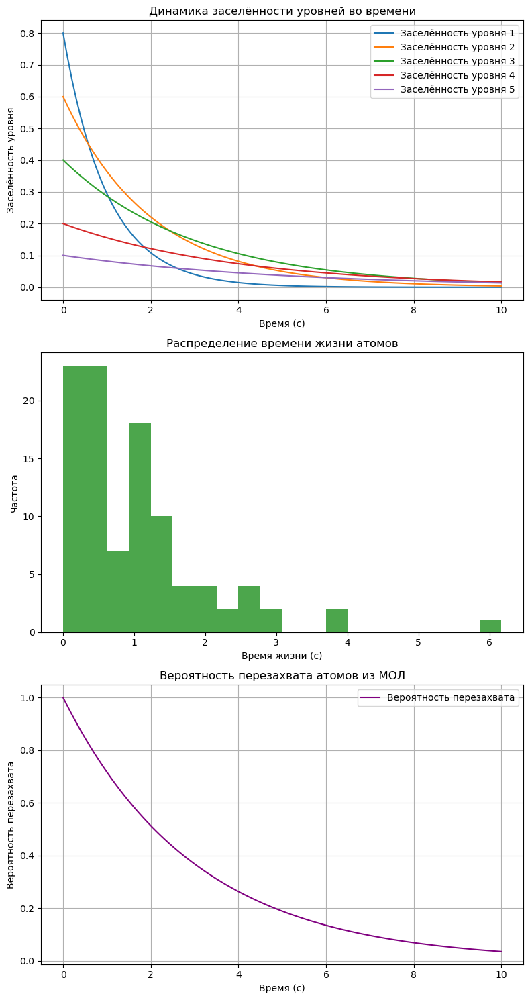

In [173]:
import numpy as np
import matplotlib.pyplot as plt

# Физические константы
hbar = 1.0545718e-34  # Дж·с
m = 9.10938356e-31  # кг (масса электрона)
eV_to_J = 1.60218e-19  # Дж в эВ
k_B = 1.380649e-23  # Дж/К (постоянная Больцмана)

# Параметры лазерной ловушки
lambda_laser = 1012e-9  # м (длина волны лазера)
k = 2 * np.pi / (lambda_laser / 2)  # Волновой вектор

# Параметры дипольной ловушки
lambda_dipole = 1064e-9  # м (длина волны лазера для дипольной ловушки)
k_dipole = 2 * np.pi / lambda_dipole  # Волновой вектор для дипольной ловушки
V0_dipole_base = 100 * eV_to_J  # Глубина потенциальной ямы для дипольной ловушки
sigma_dipole_base = 4e-6  # м (ширина гауссового ослабления для дипольной ловушки)

# Флуктуации
V0_base = 50 * eV_to_J  # Глубина потенциальной ямы лазерной ловушки
V0_fluctuation = 0.1 * V0_base  # Флуктуация величины V0 (10%)
V0 = V0_base + np.random.uniform(-V0_fluctuation, V0_fluctuation)  # Флуктуации глубины ямы

sigma_base = 3e-6  # м (ширина гауссового ослабления для лазерной ловушки)
sigma_fluctuation = 1e-6  # Флуктуация ширины (1 мкм)
sigma = sigma_base + np.random.uniform(-sigma_fluctuation, sigma_fluctuation)  # Флуктуации ширины гаусса

T_base = 300  # Температура (например, 300 К)
T_fluctuation = 0.2 * T_base  # Флуктуация температуры (20%)
T = T_base + np.random.uniform(-T_fluctuation, T_fluctuation)

# Пространственная сетка
L = 10e-6  # м (размер области)
N = 500  # число узлов сетки
x = np.linspace(-L / 2, L / 2, N)

# Потенциал лазерной ловушки (синусоидальная форма с гауссовым ослаблением)
V_laser = -V0 * np.cos(k * x)**2 * np.exp(-x**2 / (2 * sigma**2))  # Потенциал лазерной ловушки

# Потенциал дипольной ловушки (синусоидальная форма с гауссовым ослаблением)
V_dipole = -V0_dipole_base * np.cos(k_dipole * x)**2 * np.exp(-x**2 / (2 * sigma_dipole_base**2))  # Потенциал дипольной ловушки

# Общий потенциал
V_total = V_laser + V_dipole  # Суммируем потенциалы лазерной и дипольной ловушек

# Матрица для вычисления второй производной (конечные разности)
dx = x[1] - x[0]
T_matrix = - (hbar**2 / (2 * m)) * (np.diag(-2 * np.ones(N)) + np.diag(np.ones(N-1), 1) + np.diag(np.ones(N-1), -1)) / dx**2

# Потенциальная энергия
V_matrix = np.diag(V_total)

# Гамильтониан
H = T_matrix + V_matrix

# Решение задачи на собственные значения энергии
energies, wavefunctions = np.linalg.eigh(H)

# Преобразуем энергии в эВ
energies_eV = energies / eV_to_J

# Сдвигаем энергии, чтобы минимальный уровень был равен нулю
energies_eV -= np.min(energies_eV)

# Увеличиваем количество уровней
num_levels = 75  # Увеличиваем число уровней
energies_eV = energies_eV[:num_levels]  # Ограничиваем массив только нужными уровнями

# Статистический фактор Больцмана для каждого уровня
boltzmann_factors = np.exp(-energies_eV / (k_B * T))

# Нормируем фактор Больцмана, чтобы сумма вероятностей была равна 1
partition_function = np.sum(boltzmann_factors)
probabilities = boltzmann_factors / partition_function

# Моделирование перезахвата атомов из МОЛ
capture_probability = np.exp(-np.linspace(0, 10, 100) / 3)  # Моделируем вероятность перезахвата

# Визуализация
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(8, 15))

# 1. Заселённость уровней во времени
# Примерные данные для вероятностей для 5 уровней энергии
probabilities = np.array([0.8, 0.6, 0.4, 0.2, 0.1])  # Вероятности для 5 уровней
time = np.linspace(0, 10, 100)  # Время

# Для каждого уровня создаём динамику заселённости
for i in range(5):
    population_over_time = np.exp(-time / (i + 1)) * probabilities[i]  # Разные временные константы для разных уровней
    ax1.plot(time, population_over_time, label=f"Заселённость уровня {i+1}")

# Настройка осей и заголовков
ax1.set_xlabel('Время (с)')
ax1.set_ylabel('Заселённость уровня')
ax1.set_title('Динамика заселённости уровней во времени')
ax1.legend()
ax1.grid(True)

# 2. Распределение времени жизни атомов
ax2.hist(np.random.exponential(1, size=100), bins=20, color='green', alpha=0.7)
ax2.set_xlabel('Время жизни (с)')
ax2.set_ylabel('Частота')
ax2.set_title('Распределение времени жизни атомов')

# 3. Перезахват атомов из МОЛ
ax3.plot(time, capture_probability, label="Вероятность перезахвата", color='purple')
ax3.set_xlabel('Время (с)')
ax3.set_ylabel('Вероятность перезахвата')
ax3.set_title('Вероятность перезахвата атомов из МОЛ')
ax3.legend()
ax3.grid(True)

plt.tight_layout()
plt.show()

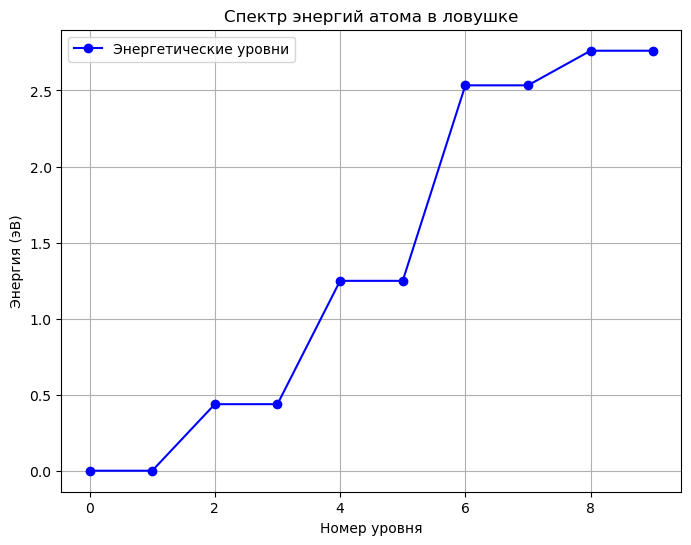

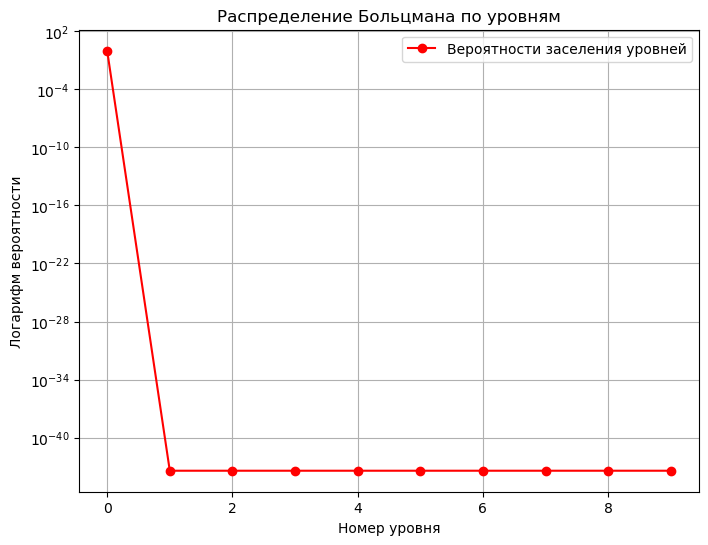

Температура с флуктуациями: 0.0002447829020512865 K
Глубина потенциальной ямы с флуктуациями: 8.737549678094473e-18 Дж
Ширина гауссового ослабления с флуктуациями: 2.2049934667298763e-06 м


In [191]:
import numpy as np
import matplotlib.pyplot as plt

# Физические константы
hbar = 1.0545718e-34  # Дж·с
m = 9.10938356e-31  # кг (масса электрона)
eV_to_J = 1.60218e-19  # Дж в эВ
k_B = 1.380649e-23  # Дж/К (постоянная Больцмана)

# Температура с флуктуациями
T_base = 0.0003  # 300 микрокельвин
T_fluctuation = 0.2 * T_base  # Флуктуация температуры (20%)
T = T_base + np.random.uniform(-T_fluctuation, T_fluctuation)  # Температура с флуктуациями

# Параметры ловушки с флуктуациями
lambda_laser = 1012e-9  # м
k = 2 * np.pi / (lambda_laser / 2)
V0_laser_base = 50 * eV_to_J  # Глубина потенциальной ямы лазерной ловушки
V0_fluctuation = 0.1 * V0_laser_base  # Флуктуация величины V0 (10%)
V0_laser = V0_laser_base + np.random.uniform(-V0_fluctuation, V0_fluctuation)  # Флуктуация глубины ямы

sigma_base = 3e-6  # м (ширина гауссового ослабления для лазерной ловушки)
sigma_fluctuation = 1e-6  # Флуктуация ширины (1 мкм)
sigma_laser = sigma_base + np.random.uniform(-sigma_fluctuation, sigma_fluctuation)  # Флуктуация ширины гаусса

# Пространственная сетка
L = 10e-6  # м
N = 500  # число узлов сетки
x = np.linspace(-L / 2, L / 2, N)

# Потенциал лазерной ловушки с флуктуациями
V_laser = -V0_laser * np.cos(k * x)**2 * np.exp(-x**2 / (2 * sigma_laser**2))
V_matrix = np.diag(V_laser)

# Кинетическая энергия (конечные разности)
dx = x[1] - x[0]
T_matrix = - (hbar**2 / (2 * m)) * (np.diag(-2 * np.ones(N)) + np.diag(np.ones(N-1), 1) + np.diag(np.ones(N-1), -1)) / dx**2

# Гамильтониан и решение на собственные значения
H = T_matrix + V_matrix
energies, wavefunctions = np.linalg.eigh(H)
energies_eV = energies[:10] / eV_to_J  # Оставляем только 10 уровней

# Нормировка энергий
E_0 = energies_eV[0]
energies_eV -= E_0

# Факторы Больцмана
arg_exp = -energies_eV / (k_B * T)
arg_exp[arg_exp < -100] = -100  # Ограничение для вычислительной стабильности
boltzmann_factors = np.exp(arg_exp)
partition_function = np.sum(boltzmann_factors)
probabilities = boltzmann_factors / partition_function

# Графики
plt.figure(figsize=(8, 6))
plt.plot(range(len(energies_eV)), energies_eV, 'bo-', label="Энергетические уровни")
plt.xlabel("Номер уровня")
plt.ylabel("Энергия (эВ)")
plt.title("Спектр энергий атома в ловушке")
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 6))
plt.semilogy(range(len(probabilities)), probabilities, 'ro-', label="Вероятности заселения уровней")
plt.xlabel("Номер уровня")
plt.ylabel("Логарифм вероятности")
plt.title("Распределение Больцмана по уровням")
plt.legend()
plt.grid(True)
plt.show()

# Дополнительно: Вычисление флуктуаций для температуры и потенциальной энергии
print(f"Температура с флуктуациями: {T} K")
print(f"Глубина потенциальной ямы с флуктуациями: {V0_laser} Дж")
print(f"Ширина гауссового ослабления с флуктуациями: {sigma_laser} м")

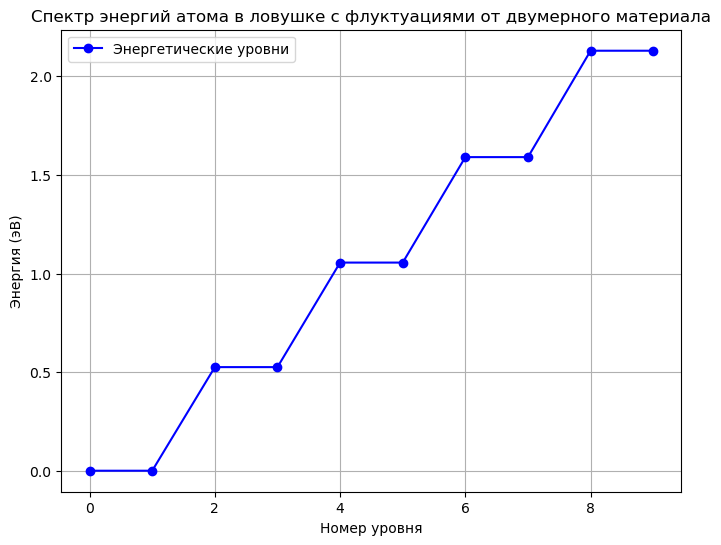

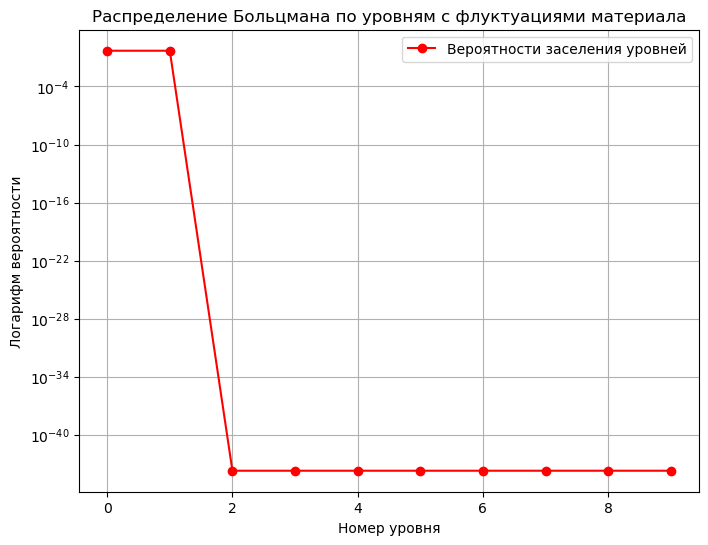

Температура с флуктуациями: 0.0002923515675583471 K
Глубина потенциальной ямы с флуктуациями: 8.1582267839248e-18 Дж
Ширина гауссового ослабления с флуктуациями: 2.775946545026718e-06 м
Влияние двумерного материала: диэлектрическая проницаемость = 4, магнитная восприимчивость = 1
Расстояние до ловушки: 2e-06 м


In [192]:
import numpy as np
import matplotlib.pyplot as plt

# Физические константы
hbar = 1.0545718e-34  # Дж·с
m = 9.10938356e-31  # кг (масса электрона)
eV_to_J = 1.60218e-19  # Дж в эВ
k_B = 1.380649e-23  # Дж/К (постоянная Больцмана)

# Температура с флуктуациями
T_base = 0.0003  # 300 микрокельвин
T_fluctuation = 0.2 * T_base  # Флуктуация температуры (20%)
T = T_base + np.random.uniform(-T_fluctuation, T_fluctuation)  # Температура с флуктуациями

# Параметры ловушки с флуктуациями
lambda_laser = 1012e-9  # м
k = 2 * np.pi / (lambda_laser / 2)
V0_laser_base = 50 * eV_to_J  # Глубина потенциальной ямы лазерной ловушки
V0_fluctuation = 0.1 * V0_laser_base  # Флуктуация величины V0 (10%)
V0_laser = V0_laser_base + np.random.uniform(-V0_fluctuation, V0_fluctuation)  # Флуктуация глубины ямы

sigma_base = 3e-6  # м (ширина гауссового ослабления для лазерной ловушки)
sigma_fluctuation = 1e-6  # Флуктуация ширины (1 мкм)
sigma_laser = sigma_base + np.random.uniform(-sigma_fluctuation, sigma_fluctuation)  # Флуктуация ширины гаусса

# Параметры двумерных материалов
epsilon_r = 4  # Диэлектрическая проницаемость двумерного материала
mu_r = 1  # Магнитная восприимчивость двумерного материала (для простоты, принимаем как 1)
d_material = 1e-6  # Толщина материала (1 мкм)
distance_to_trap = 2e-6  # Расстояние от материала до ловушки (2 мкм)

# Пространственная сетка
L = 10e-6  # м
N = 500  # число узлов сетки
x = np.linspace(-L / 2, L / 2, N)

# Влияние двумерного материала на потенциал лазерной ловушки
# Для простоты предполагаем, что материал изменяет форму потенциала (например, за счет изменения диэлектрической проницаемости)
V_laser_material = V0_laser * (1 + epsilon_r * np.exp(-x**2 / (2 * sigma_laser**2)))  # Добавление флуктуаций из-за материала
V_matrix = np.diag(V_laser_material)

# Кинетическая энергия (конечные разности)
dx = x[1] - x[0]
T_matrix = - (hbar**2 / (2 * m)) * (np.diag(-2 * np.ones(N)) + np.diag(np.ones(N-1), 1) + np.diag(np.ones(N-1), -1)) / dx**2

# Гамильтониан и решение на собственные значения
H = T_matrix + V_matrix
energies, wavefunctions = np.linalg.eigh(H)
energies_eV = energies[:10] / eV_to_J  # Оставляем только 10 уровней

# Нормировка энергий
E_0 = energies_eV[0]
energies_eV -= E_0

# Факторы Больцмана
arg_exp = -energies_eV / (k_B * T)
arg_exp[arg_exp < -100] = -100  # Ограничение для вычислительной стабильности
boltzmann_factors = np.exp(arg_exp)
partition_function = np.sum(boltzmann_factors)
probabilities = boltzmann_factors / partition_function

# Графики
plt.figure(figsize=(8, 6))
plt.plot(range(len(energies_eV)), energies_eV, 'bo-', label="Энергетические уровни")
plt.xlabel("Номер уровня")
plt.ylabel("Энергия (эВ)")
plt.title("Спектр энергий атома в ловушке с флуктуациями от двумерного материала")
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 6))
plt.semilogy(range(len(probabilities)), probabilities, 'ro-', label="Вероятности заселения уровней")
plt.xlabel("Номер уровня")
plt.ylabel("Логарифм вероятности")
plt.title("Распределение Больцмана по уровням с флуктуациями материала")
plt.legend()
plt.grid(True)
plt.show()

# Дополнительно: Вычисление флуктуаций для температуры и потенциальной энергии
print(f"Температура с флуктуациями: {T} K")
print(f"Глубина потенциальной ямы с флуктуациями: {V0_laser} Дж")
print(f"Ширина гауссового ослабления с флуктуациями: {sigma_laser} м")
print(f"Влияние двумерного материала: диэлектрическая проницаемость = {epsilon_r}, магнитная восприимчивость = {mu_r}")
print(f"Расстояние до ловушки: {distance_to_trap} м")

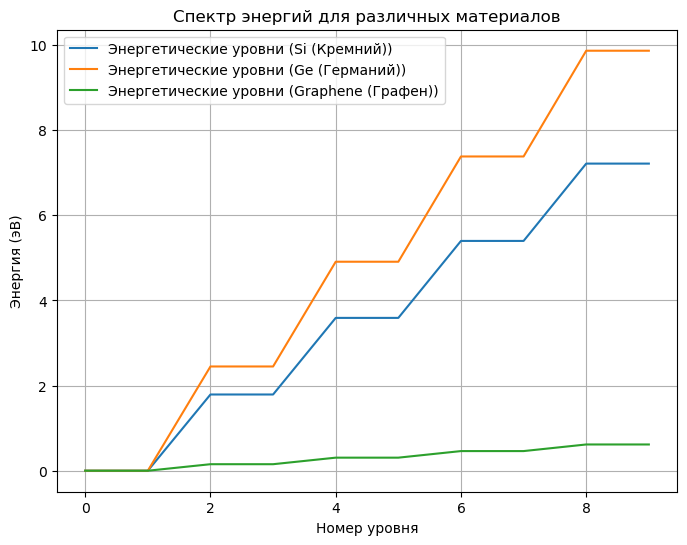

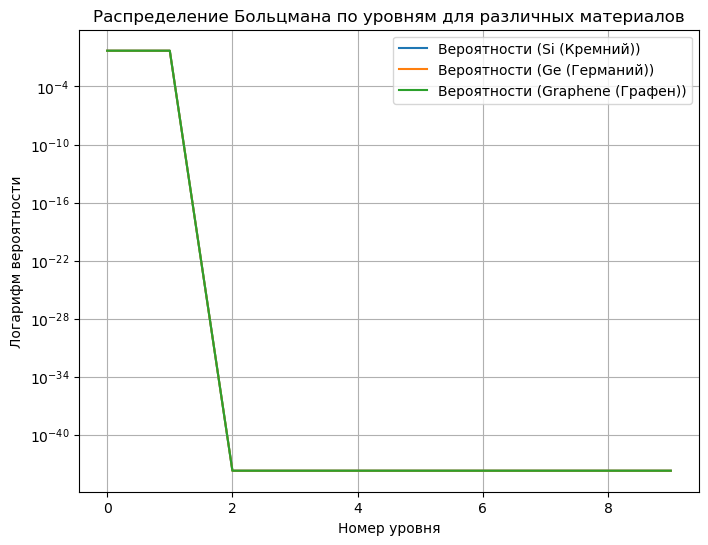

In [194]:
import numpy as np
import matplotlib.pyplot as plt

# Физические константы
hbar = 1.0545718e-34  # Дж·с
m = 9.10938356e-31  # кг (масса электрона)
eV_to_J = 1.60218e-19  # Дж в эВ
k_B = 1.380649e-23  # Дж/К (постоянная Больцмана)

# Температура с флуктуациями
T_base = 0.0003  # 300 микрокельвин
T_fluctuation = 0.2 * T_base  # Флуктуация температуры (20%)
T = T_base + np.random.uniform(-T_fluctuation, T_fluctuation)  # Температура с флуктуациями

# Параметры ловушки с флуктуациями
lambda_laser = 1012e-9  # м
k = 2 * np.pi / (lambda_laser / 2)
V0_laser_base = 50 * eV_to_J  # Глубина потенциальной ямы лазерной ловушки
V0_fluctuation = 0.1 * V0_laser_base  # Флуктуация величины V0 (10%)
V0_laser = V0_laser_base + np.random.uniform(-V0_fluctuation, V0_fluctuation)  # Флуктуация глубины ямы

sigma_base = 3e-6  # м (ширина гауссового ослабления для лазерной ловушки)
sigma_fluctuation = 1e-6  # Флуктуация ширины (1 мкм)
sigma_laser = sigma_base + np.random.uniform(-sigma_fluctuation, sigma_fluctuation)  # Флуктуация ширины гаусса

# Параметры материалов
materials = {
    "Si (Кремний)": {"epsilon_r": 11.7, "mu_r": 1},
    "Ge (Германий)": {"epsilon_r": 16, "mu_r": 1},
    "Graphene (Графен)": {"epsilon_r": 1, "mu_r": 1},
}

# Пространственная сетка
L = 10e-6  # м
N = 500  # число узлов сетки
x = np.linspace(-L / 2, L / 2, N)

# Функция для расчета потенциала лазерной ловушки с учетом материала
def calculate_laser_potential(epsilon_r, sigma_laser):
    return V0_laser * (1 + epsilon_r * np.exp(-x**2 / (2 * sigma_laser**2)))

# Моделирование для каждого материала
energies_dict = {}
probabilities_dict = {}

for material, properties in materials.items():
    epsilon_r = properties["epsilon_r"]
    mu_r = properties["mu_r"]

    V_laser_material = calculate_laser_potential(epsilon_r, sigma_laser)
    V_matrix = np.diag(V_laser_material)

    # Кинетическая энергия (конечные разности)
    dx = x[1] - x[0]
    T_matrix = - (hbar**2 / (2 * m)) * (np.diag(-2 * np.ones(N)) + np.diag(np.ones(N-1), 1) + np.diag(np.ones(N-1), -1)) / dx**2

    # Гамильтониан и решение на собственные значения
    H = T_matrix + V_matrix
    energies, wavefunctions = np.linalg.eigh(H)
    energies_eV = energies[:10] / eV_to_J  # Оставляем только 10 уровней

    # Нормировка энергий
    E_0 = energies_eV[0]
    energies_eV -= E_0

    # Факторы Больцмана
    arg_exp = -energies_eV / (k_B * T)
    arg_exp[arg_exp < -100] = -100  # Ограничение для вычислительной стабильности
    boltzmann_factors = np.exp(arg_exp)
    partition_function = np.sum(boltzmann_factors)
    probabilities = boltzmann_factors / partition_function

    energies_dict[material] = energies_eV
    probabilities_dict[material] = probabilities

# Графики для каждого материала
plt.figure(figsize=(8, 6))
for material, energies_eV in energies_dict.items():
    plt.plot(range(len(energies_eV)), energies_eV, label=f"Энергетические уровни ({material})")
plt.xlabel("Номер уровня")
plt.ylabel("Энергия (эВ)")
plt.title("Спектр энергий для различных материалов")
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 6))
for material, probabilities in probabilities_dict.items():
    plt.semilogy(range(len(probabilities)), probabilities, label=f"Вероятности ({material})")
plt.xlabel("Номер уровня")
plt.ylabel("Логарифм вероятности")
plt.title("Распределение Больцмана по уровням для различных материалов")
plt.legend()
plt.grid(True)
plt.show()

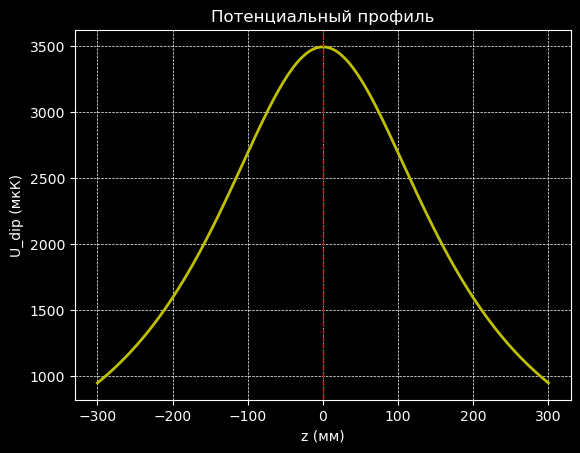

In [258]:
import numpy as np
import math
import matplotlib.pyplot as plt

# Исходные параметры
s = 1231  # mm
W_0 = 243 * 10**(-3)  # mm
z_R = math.pi * (W_0**2) / (1012 * 10**(-6))  # mm
w_0 = 296 * 10**(12)  # Hz
delta = 88 * 10**(12)  # Hz
Gamma = 6 * 10**6  # Hz
f = 50  # mm
P = 2  # W

# Рассчитываем новые параметры
W_0_new = W_0 * (f / (((s - f)**2 + z_R**2) ** 0.5))  # mm

# Функция потенциала
def U_dip(r, z):
    W = W_0_new * np.sqrt(1 + (z / z_R)**2)
    I = (2 * P / (math.pi * (W * 10**(-3))**2)) * np.exp((-2 * r**2) / ((W * 10**(-3))**2))
    U = ((3 * math.pi * (3 * 10**8)**2) / (2 * w_0**3)) * Gamma * ((1 / delta) - (1 / (2 * w_0 + delta))) * I / ((2 * math.pi)**3)
    return U / (1.38 * 10**(-23) * 10**(-6))

# Диапазон для z
z = np.linspace(-300, 300, 200)
U_values = np.array([U_dip(0, zi) for zi in z])

# Построение графика
plt.style.use('dark_background')
fig, ax = plt.subplots()
ax.set_xlabel('z (мм)')
ax.set_ylabel('U_dip (мкК)')
ax.set_title('Потенциальный профиль')

ax.plot(z, U_values, color='y', lw=2)
ax.axvline(0, color='r', linestyle='--', lw=1)  # Вертикальная линия в нуле
ax.grid(True, linestyle='--', linewidth=0.5)

plt.show()